In [1]:
%matplotlib inline

import pickle
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from functools import reduce
import numpy as np
import pandas as pd
import ipdb
import copy
plt.rcParams['figure.dpi'] = 150

In [2]:
p2AUC_dict_simic = '/data/jianhao/hepatocyte_update_dataset_101619/AUC_dict_A249P_1120'
p2AUC_dict_no_simic = '/data/jianhao/hepatocyte_update_dataset_101619/AUC_dict_A249P_1121_no_simic'

------
# Compute histogram of AUC for all TFs

In [3]:
def compute_hist(AUC_dict, num_TF = 200):
    x_min = np.ones(num_TF)
    x_max = -1 * np.ones(num_TF)
    # find min and max of AUC values in all states.
    for label in AUC_dict:
        min_AUC = AUC_dict[label].min(axis = 0)
        max_AUC = AUC_dict[label].max(axis = 0)
        x_min = np.minimum(min_AUC, x_min)
        x_max = np.maximum(max_AUC, x_max)

    i = 5
    TF_hist_dict = {}
    for idx, TF in enumerate(AUC_dict[1].columns):    
    #     i -= 1
        TF_hist_dict[TF] = {}
        nbins = 50
        bar_width =  (-x_min[idx] + x_max[idx]) / nbins
        bin_list = np.arange(x_min[idx], x_max[idx] + bar_width, bar_width)


        label_order = sorted(list(AUC_dict.keys()))

        for label in label_order:
            AUC_df = AUC_dict[label]      
            y = AUC_df[TF].values.tolist()

            hist, _ = np.histogram(y, bins = bin_list,
                                  weights=np.ones(len(y)) / len(y))

            xs = (bin_list[:-1] + bin_list[1:])/2
            legend_name = 'state {}'.format(label)

            TF_hist_dict[TF][label] = {
                'hist': hist,
                'xs': xs
            }
        if i < 0:
            break
    return TF_hist_dict

def compute_hist_mat(TF_hist_dict):
    TF_hist_mat_dict = {}
    num_of_TF = len(TF_hist_dict)
    for TF in TF_hist_dict:
        num_of_bins = len(TF_hist_dict[TF][1]['hist'])
        num_of_labels = len(TF_hist_dict[TF])
        tmp_hist_mat = np.zeros((num_of_labels, num_of_bins))
        for row_idx, label in enumerate(TF_hist_dict[TF]):
            tmp_row = TF_hist_dict[TF][label]['hist']
            tmp_hist_mat[row_idx, :] = tmp_row
        TF_hist_mat_dict[TF] = tmp_hist_mat
    return TF_hist_mat_dict
        
def get_hist_mat_dict(p2AUC_dict, num_TF = 200):
    with open(p2AUC_dict, 'rb') as f:
        AUC_dict = pickle.load(f)
    TF_hist_dict = compute_hist(AUC_dict, num_TF)
    TF_hist_mat_dict = compute_hist_mat(TF_hist_dict)
    return TF_hist_mat_dict, TF_hist_dict

In [4]:
TF_hist_mat_dict_simic, TF_hist_dict_simic = get_hist_mat_dict(p2AUC_dict_simic)
TF_hist_mat_dict_no_simic, TF_hist_dict_no_simic = get_hist_mat_dict(p2AUC_dict_no_simic)
len(TF_hist_mat_dict_simic)

200

In [5]:
TF_hist_dict_simic

{'Ncoa2': {0: {'hist': array([7.12565674e-02, 1.80056918e-02, 2.00853765e-02, 3.25087566e-02,
          2.38069177e-02, 5.73555166e-02, 1.77265762e-01, 8.23664623e-02,
          5.80122592e-02, 5.84500876e-02, 2.95205779e-01, 2.02495622e-02,
          1.42841506e-02, 1.75131349e-03, 1.20402802e-03, 9.30385289e-04,
          1.31348511e-03, 1.58712785e-03, 2.07968476e-03, 3.55735552e-03,
          3.39316988e-03, 1.03984238e-03, 2.18914186e-03, 7.22416813e-03,
          8.20928196e-03, 7.77145359e-03, 1.77867776e-02, 2.40805604e-03,
          2.79115587e-03, 4.26882662e-03, 4.37828371e-04, 5.47285464e-05,
          1.09457093e-04, 1.09457093e-04, 0.00000000e+00, 0.00000000e+00,
          0.00000000e+00, 5.47285464e-05, 1.64185639e-04, 0.00000000e+00,
          2.18914186e-04, 4.92556918e-04, 0.00000000e+00, 0.00000000e+00,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00]),
   'xs': array([0.34789511, 0.35

------
# Compute the total variant of histograms

In [6]:
def total_variant(dist1, dist2):
    abs_diff = np.abs(np.array(dist1) - np.array(dist2))
    TV = 1/2 * np.sum(abs_diff)
    return TV

def aver_TV_of_hist(hist_mat):
    '''
    hist_mat: num_labels * len_of_hist
    '''
    num_labels, _ = hist_mat.shape
    count_of_TVs = num_labels * (num_labels - 1)
    sum_of_TVs = 0
    for row_idx in range(num_labels):
        remaining_rows = np.delete(np.arange(num_labels), row_idx)
        row_1 = hist_mat[row_idx, :]
        for row_2_idx in remaining_rows:
            row_2 = hist_mat[row_2_idx, :]
            sum_of_TVs += total_variant(row_1, row_2)
    average_TV = sum_of_TVs / count_of_TVs
    return average_TV
    
def list_of_TV_of_hist(hist_mat):
    '''
    hist_mat: num_labels * len_of_hist
    '''
    num_labels, _ = hist_mat.shape
    count_of_TVs = num_labels * (num_labels - 1)
    list_of_TVs = []
    for row_idx in range(num_labels):
        remaining_rows = range(row_idx + 1, num_labels)
        row_1 = hist_mat[row_idx, :]
        for row_2_idx in remaining_rows:
            row_2 = hist_mat[row_2_idx, :]
            tmp_TV = total_variant(row_1, row_2)
            list_of_TVs.append(tmp_TV)
    return list_of_TVs

def minmax_variant_of_hist(hist_mat):
    max_hist = np.max(hist_mat, axis = 0)
    min_hist = np.min(hist_mat, axis = 0)
    minmax_diff = max_hist - min_hist
    variant = np.sum(np.abs(minmax_diff)) / hist_mat.shape[0]
    
    return variant

In [7]:
def get_divergence_df(TF_hist_mat_dict):
    hist_divergence_df = pd.DataFrame(columns = TF_hist_mat_dict.keys(), 
                                      index = ['average TV', 'median TV', 'max TV', 'minmax variant'])
    for TF in TF_hist_mat_dict.keys():
        tmp_hist_mat = TF_hist_mat_dict[TF]
        tf_aver_TV = aver_TV_of_hist(tmp_hist_mat)
        hist_divergence_df[TF]['average TV'] = tf_aver_TV

        TV_list = list_of_TV_of_hist(tmp_hist_mat)

        tf_median_TV = np.median(TV_list)
        hist_divergence_df[TF]['median TV'] = tf_median_TV

        tf_max_TV = np.max(TV_list)
        hist_divergence_df[TF]['max TV'] = tf_max_TV

        tf_minmax_variant = minmax_variant_of_hist(tmp_hist_mat)
        hist_divergence_df[TF]['minmax variant'] = tf_minmax_variant
    return hist_divergence_df

def get_TF_list_intersection(hist_divergence_df, k):
    sorted_by_ave_hist_divergence_df = hist_divergence_df.sort_values(by = 'average TV', axis = 1, ascending = False)
    sorted_by_med_hist_divergence_df = hist_divergence_df.sort_values(by = 'median TV', axis = 1, ascending = False)
    sorted_by_max_hist_divergence_df = hist_divergence_df.sort_values(by = 'max TV', axis = 1, ascending = False)
    sorted_by_minmax_var_divergence_df = hist_divergence_df.sort_values(by = 'minmax variant', axis = 1, ascending = False)
        
    top_k_minmax_TF = sorted_by_minmax_var_divergence_df.columns.values[:k]
    last_k_minmax_TF = sorted_by_minmax_var_divergence_df.columns.values[-k:]

    top_k_max_TF = sorted_by_max_hist_divergence_df.columns.values[:k]
    last_k_max_TF = sorted_by_max_hist_divergence_df.columns.values[-k:]

    top_k_median_TF = sorted_by_med_hist_divergence_df.columns.values[:k]
    last_k_median_TF = sorted_by_med_hist_divergence_df.columns.values[-k:]

    top_k_average_TF = sorted_by_ave_hist_divergence_df.columns.values[:k]
    last_k_average_TF = sorted_by_ave_hist_divergence_df.columns.values[-k:]

    top_d = (top_k_minmax_TF, top_k_max_TF, top_k_median_TF, top_k_average_TF)
    top_variant_TF = set.intersection(*map(set,top_d))

    last_d = (last_k_minmax_TF, last_k_max_TF, last_k_median_TF, last_k_average_TF)
    last_variant_TF = set.intersection(*map(set, last_d))
    
    return top_variant_TF, last_variant_TF

------
# Get TF list

In [8]:
k = 50

diver_df_simic = get_divergence_df(TF_hist_mat_dict_simic)
top_TF_simic, last_TF_simic = get_TF_list_intersection(diver_df_simic, k)

diver_df_no_simic = get_divergence_df(TF_hist_mat_dict_no_simic)
top_TF_no_simic, last_TF_no_simic = get_TF_list_intersection(diver_df_no_simic, k)

# find the common and difference among sets.
common_top = top_TF_simic.intersection(top_TF_no_simic)
common_last = last_TF_simic.intersection(last_TF_no_simic)

top_only_simic = top_TF_simic.difference(common_top)
top_only_no_simic = top_TF_no_simic.difference(common_top)

last_only_simic = last_TF_simic.difference(common_last)
last_only_no_simic = last_TF_no_simic.difference(common_last)

top_simic_last_no_simic = top_TF_simic.intersection(last_TF_no_simic)
last_simic_top_no_simic = last_TF_simic.intersection(top_TF_no_simic)

print('common top in simic and no-simic: ', len(common_top))
print(common_top)
print('- ' * 7)

print('common last in simic and no-simic: ', len(common_last))
print(common_last)
print('- ' * 7)

print()
print('>>' * 7, 'simic', '>>' * 7)
print('top only in simic: ', len(top_only_simic))
print(top_only_simic)
print('- ' * 7)

print('last only in simic: ', len(last_only_simic))
print(last_only_simic)
print('- ' * 7)

print()
print('>>' * 7, 'no-simic', '>>' * 7)
print('top only in no-simic: ', len(top_only_no_simic))
print(top_only_no_simic)
print('- ' * 7)

print('last only in no-simic: ', len(last_only_no_simic))
print(last_only_no_simic)
print('- ' * 7)

print()
print('>>' * 7, 'contradicting cases', '>>' * 7)
print('top in simic, but last in no-simic: ', len(top_simic_last_no_simic))
print(top_simic_last_no_simic)
print('- ' * 7)

print('last in simic, but top in no-simic: ', len(last_simic_top_no_simic))
print(last_simic_top_no_simic)
print('- ' * 7)

common top in simic and no-simic:  29
{'Smarca5', 'Nr1i3', 'Egr1', 'Nfia', 'Ybx3', 'Hopx', 'Ncor1', 'Hhex', 'Phf5a', 'Rxra', 'Epas1', 'Xbp1', 'Hes6', 'Foxq1', 'Id3', 'Atf5', 'Nr2f6', 'Gatad1', 'Onecut2', 'Nfib', 'Tcf25', 'Klf9', 'Mlx', 'Hnf4a', 'Prox1', 'Foxa3', 'Klf15', 'Srebf1', 'Cebpa'}
- - - - - - - 
common last in simic and no-simic:  7
{'Arid4b', 'Stat6', 'Lyar', 'Hsf2', 'Csrnp1', 'Rc3h2', 'Bcl3'}
- - - - - - - 

>>>>>>>>>>>>>> simic >>>>>>>>>>>>>>
top only in simic:  10
{'Nr1h3', 'Yy1', 'Nono', 'Atf2', 'Cebpb', 'Nr1h4', 'Creb3l3', 'Zbtb20', 'Ahr', 'Ybx1'}
- - - - - - - 
last only in simic:  20
{'Nfe2l2', 'Ubtf', 'Aebp2', 'Stat1', 'Rara', 'Rest', 'Tfe3', 'Rreb1', 'Mxi1', 'Foxn3', 'Tbx3', 'Nr0b2', 'Zfp637', 'Maf', 'Tox4', 'Stat5b', 'Zkscan1', 'Irf3', 'Smad4', 'Kdm5a'}
- - - - - - - 

>>>>>>>>>>>>>> no-simic >>>>>>>>>>>>>>
top only in no-simic:  11
{'Rora', 'Tfdp2', 'Crem', 'Id2', 'Mlxipl', 'Jund', 'Pura', 'Zfp91', 'Dbp', 'Tfam', 'Tsc22d3'}
- - - - - - - 
last only in no-simic:  19

In [9]:
def plot_two_in_row(TF_hist_dict_simic, TF_hist_dict_no_simic, gene_list):
    plt.rcParams['figure.dpi'] = 150
    for _, TF in enumerate(gene_list):    
        fig = plt.figure(figsize=plt.figaspect(0.4))
        print(TF)
        for idx, TF_hist_dict in enumerate([TF_hist_dict_simic, TF_hist_dict_no_simic]):
            label_order = sorted(list(TF_hist_dict[TF].keys()))
            ax = fig.add_subplot(1, 2, idx + 1, projection='3d')
            
            for label in label_order:
                xs = TF_hist_dict[TF][label]['xs']
                hist = TF_hist_dict[TF][label]['hist']
                nbins = len(xs)
                bar_width =  (xs[-1] - xs[0]) / nbins

                try:
                    ax.bar(xs, hist, zs = label, 
                           zdir = 'y',
                           width = bar_width,
                           alpha = 0.8,
                          )
                except:
                    print('error in ax.bar')
                    continue

            
            ax.set_xlabel('AUC')
            ax.set_ylabel('cell states')
            ax.set_yticks(label_order)
            if idx == 0:
                cond = 'simic'
            else:
                cond = 'no-simic'
            ax.set_title('{}: Histogram of TF {}'.format(cond, TF.upper()))
        plt.show()


# TFs that are only rank top variant in simic

Nr1h3


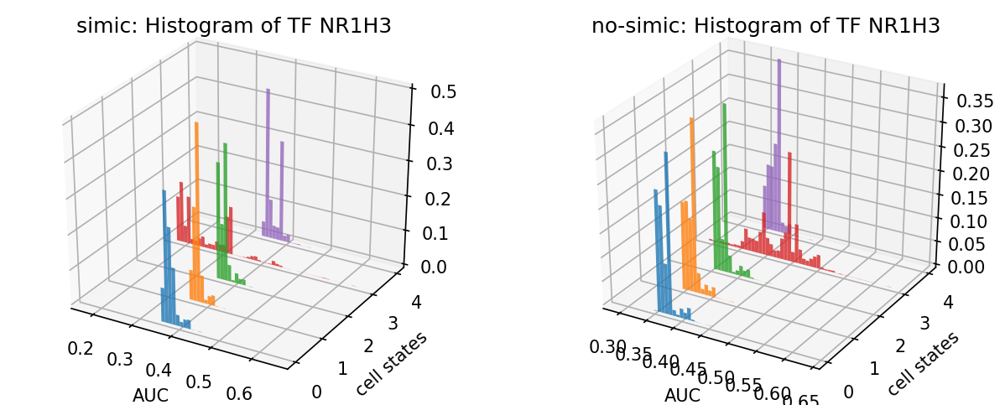

Yy1


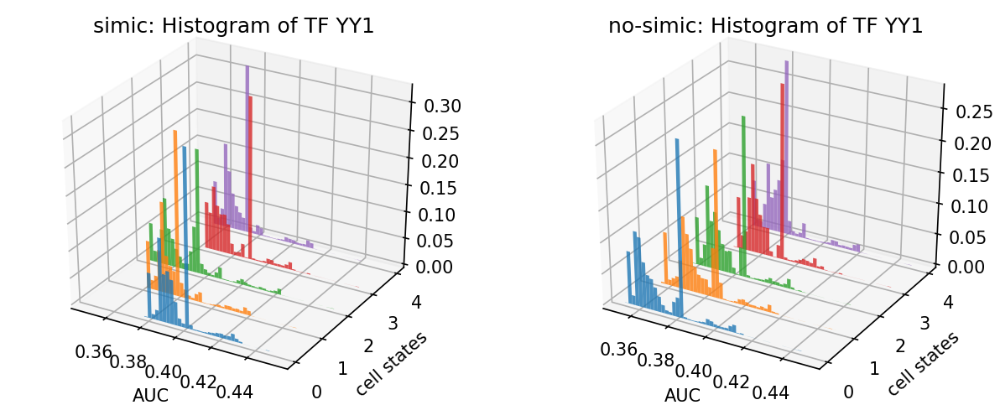

Nono


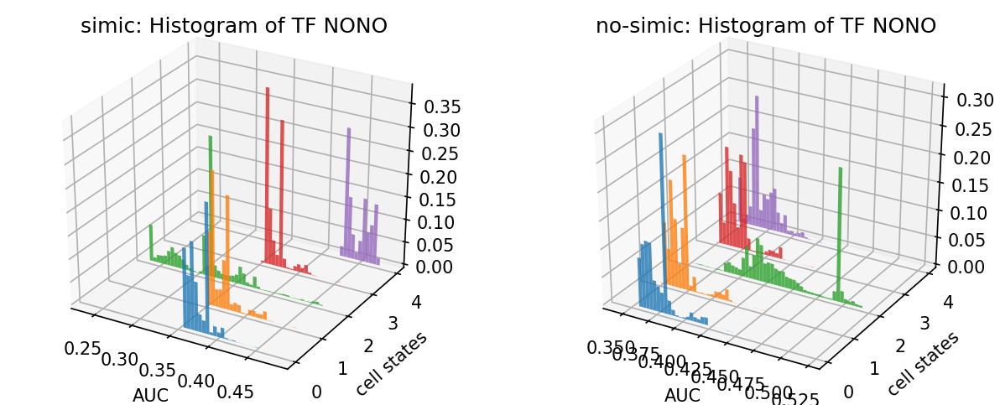

Atf2


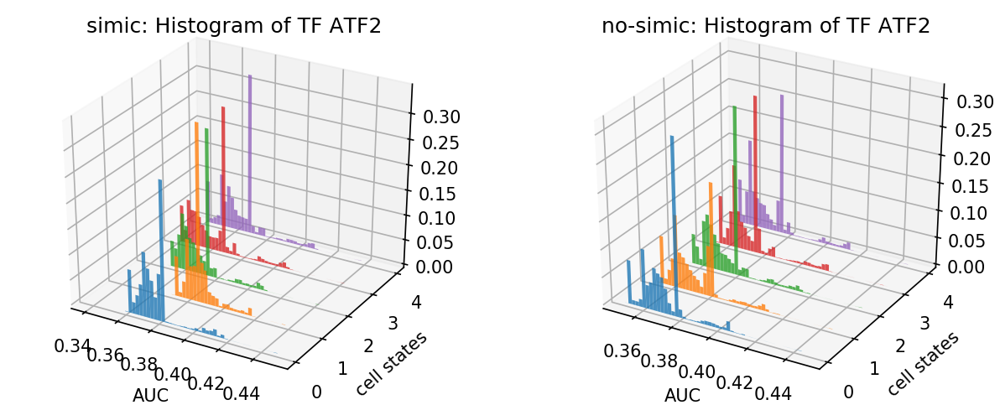

Cebpb


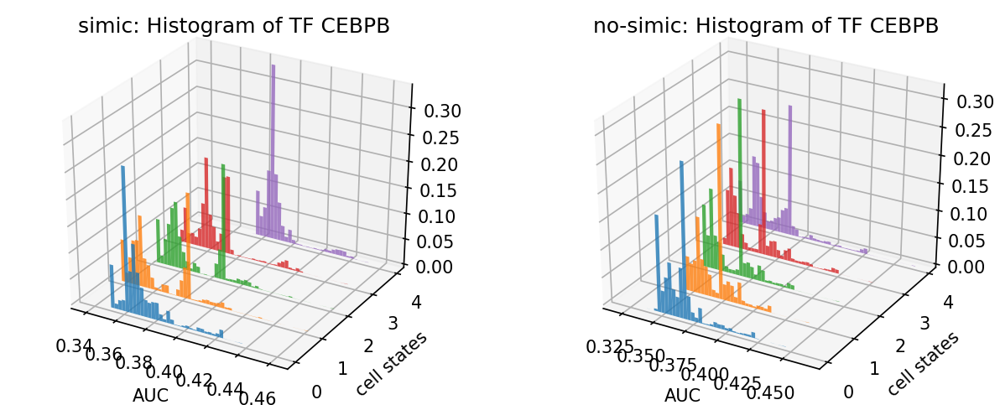

Nr1h4


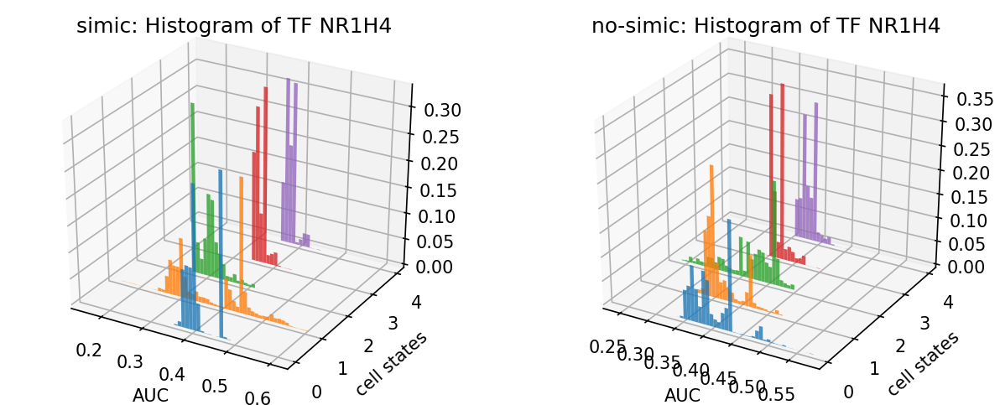

Creb3l3


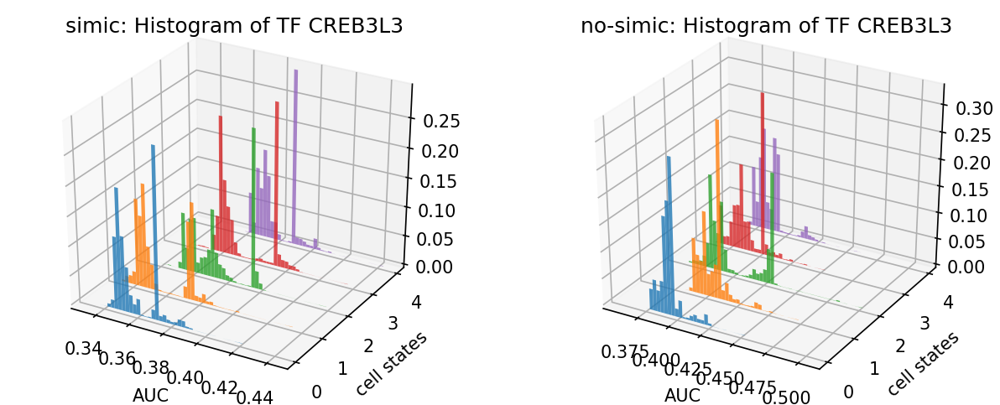

Zbtb20


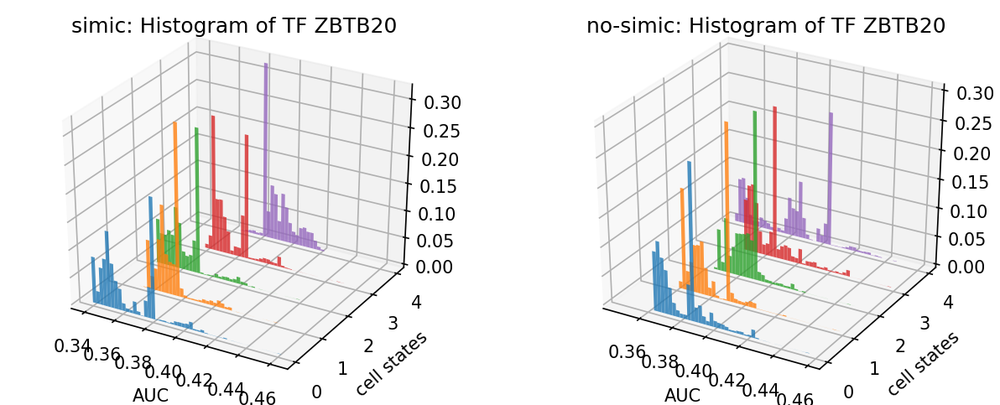

Ahr


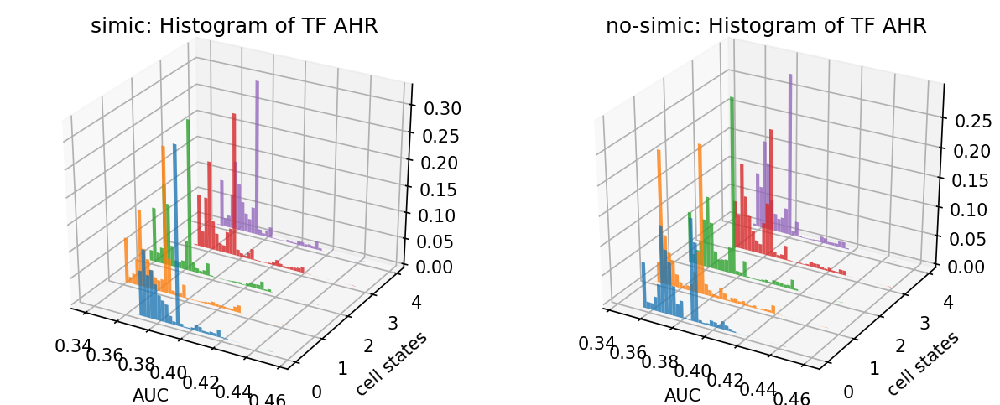

Ybx1


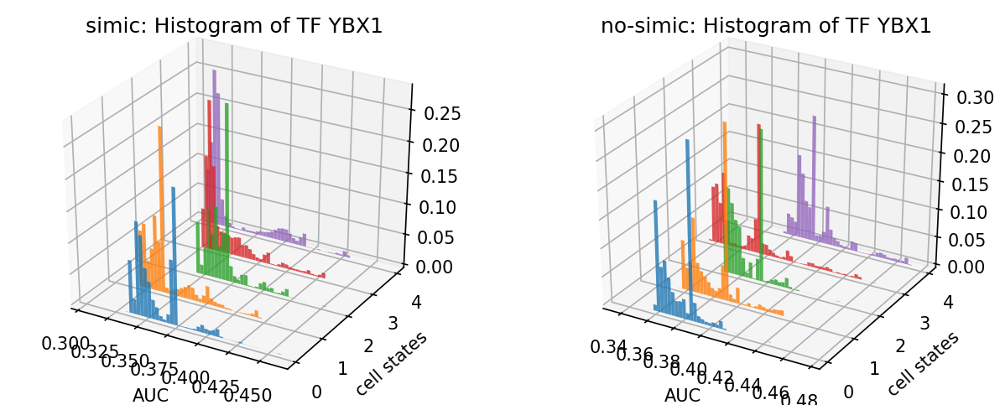

In [10]:
plot_two_in_row(TF_hist_dict_simic, TF_hist_dict_no_simic, top_only_simic)

# TFs that are only rank top varint in no-simic

Rora


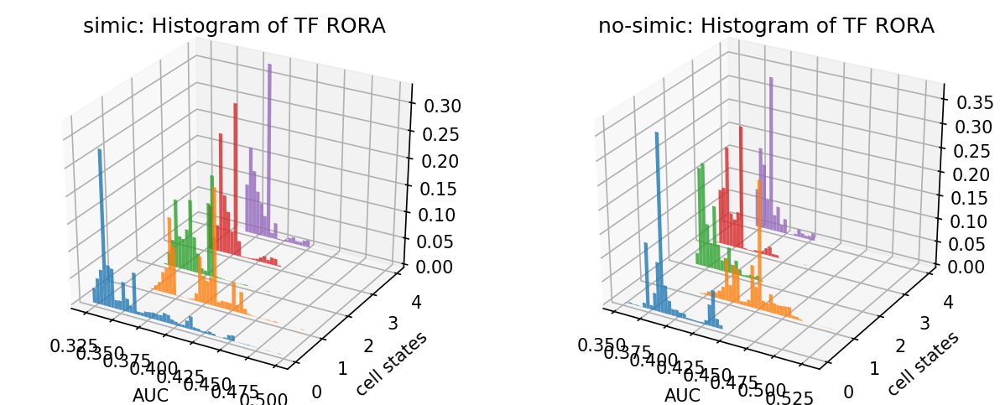

Tfdp2


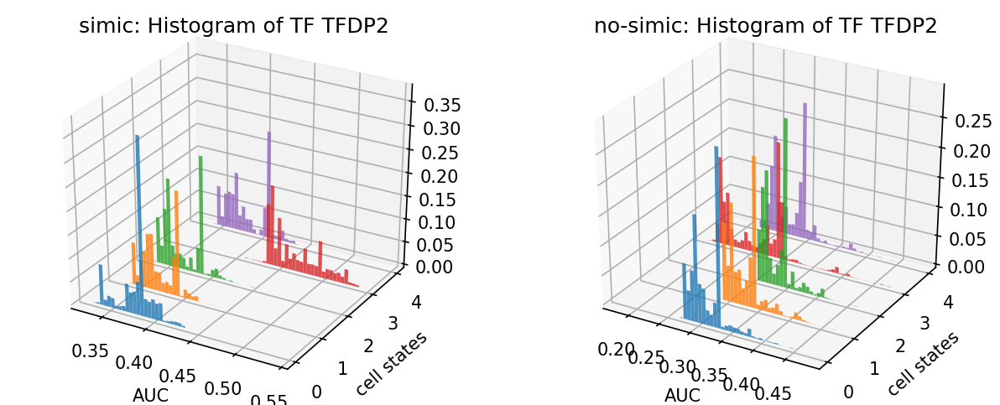

Crem


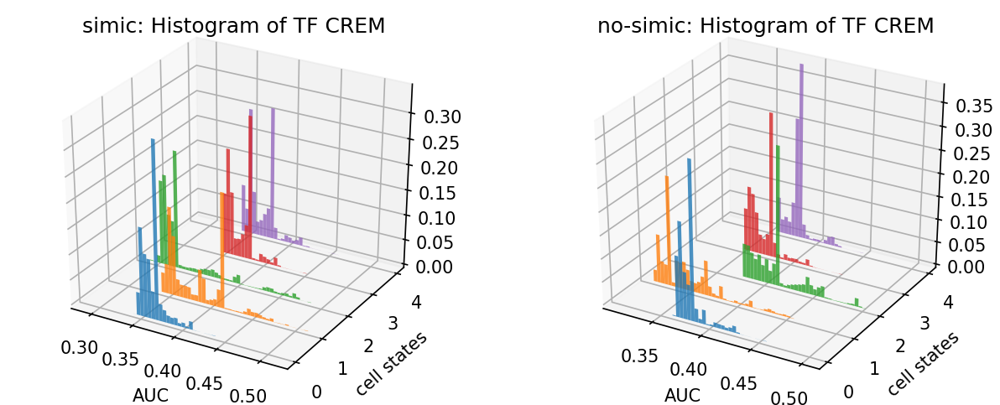

Id2


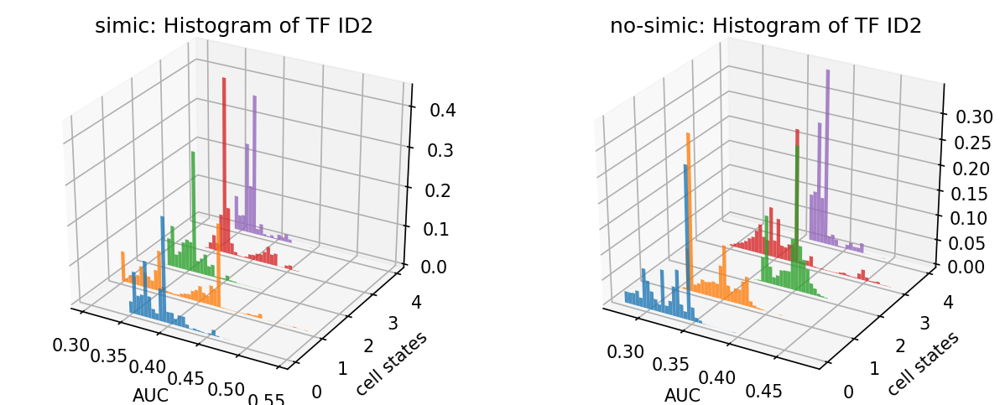

Mlxipl


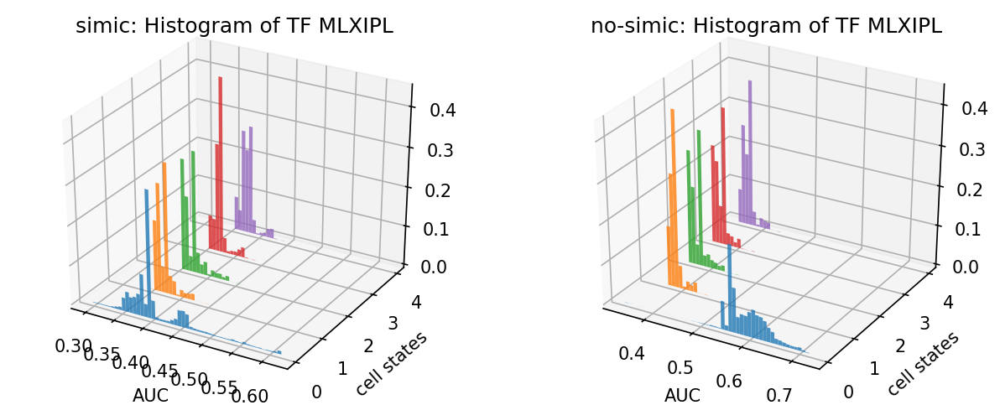

Jund


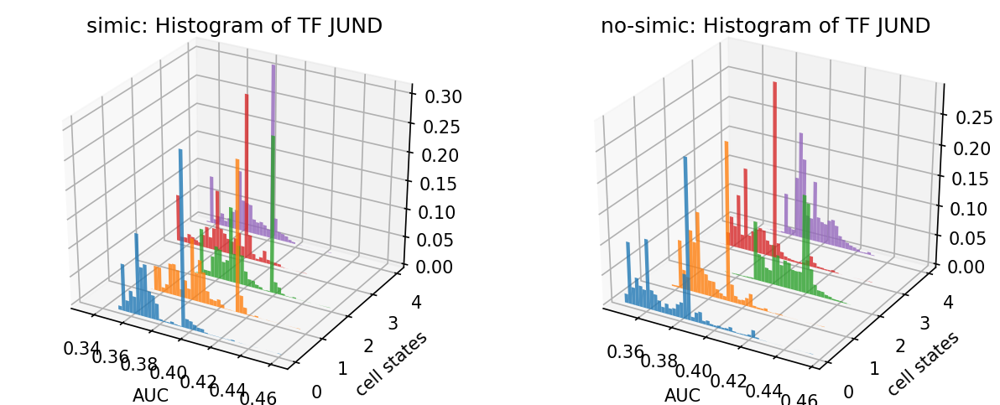

Pura


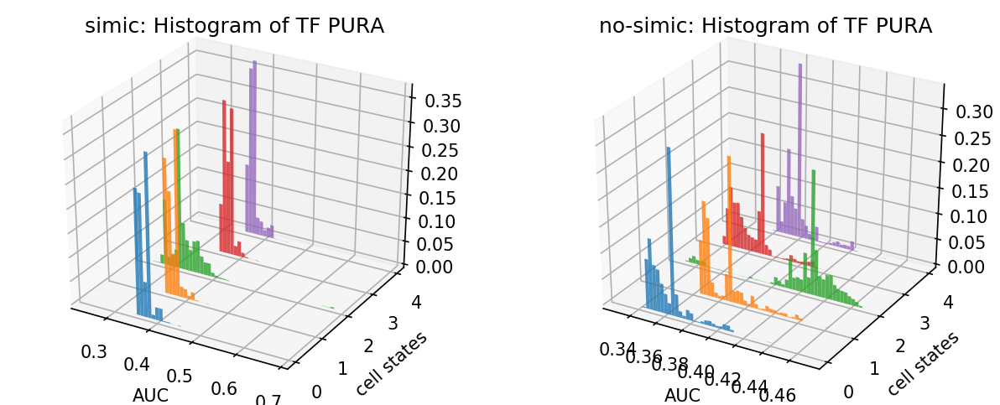

Zfp91


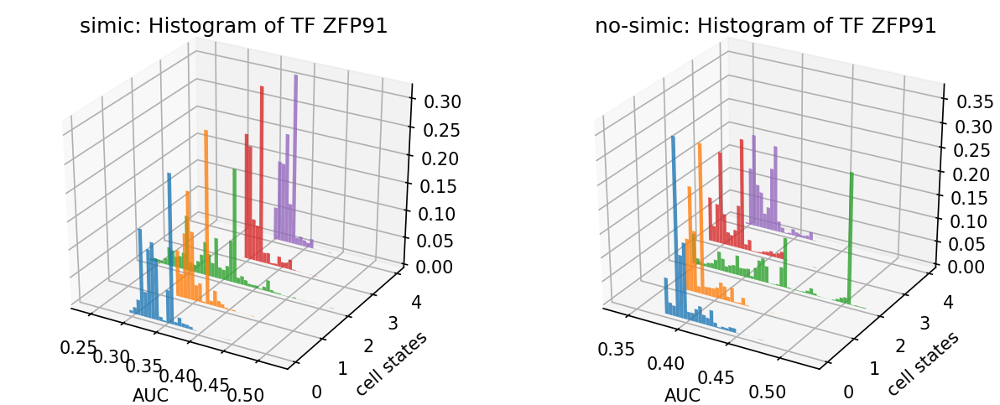

Dbp


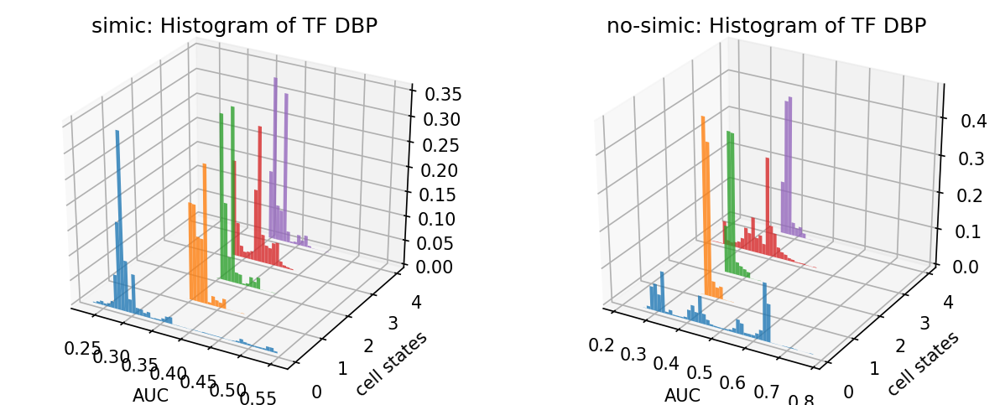

Tfam


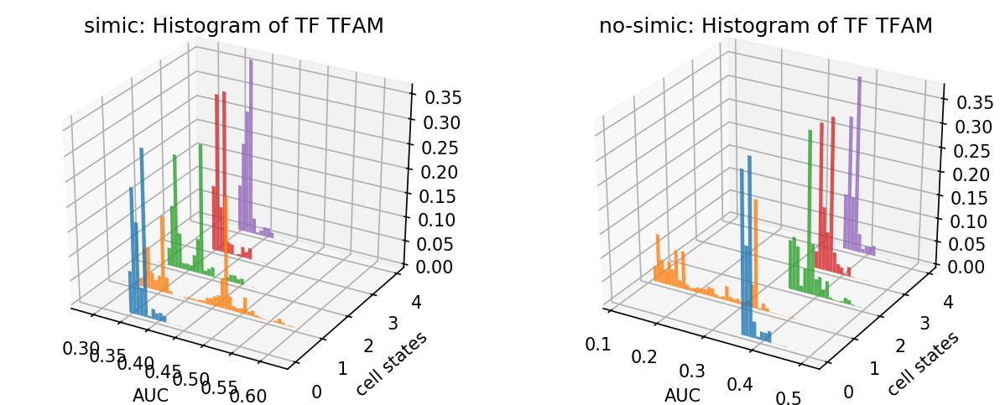

Tsc22d3


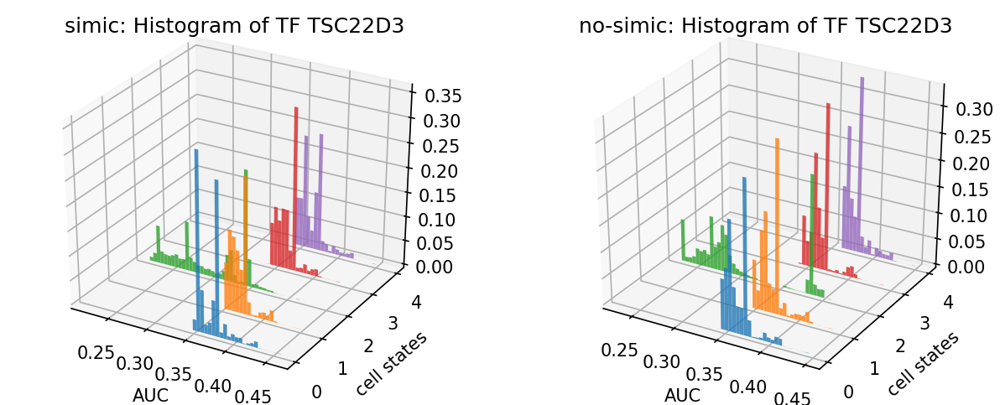

In [11]:
plot_two_in_row(TF_hist_dict_simic, TF_hist_dict_no_simic, top_only_no_simic)

--------
# TFs that are only rank last variant in simic

Nfe2l2


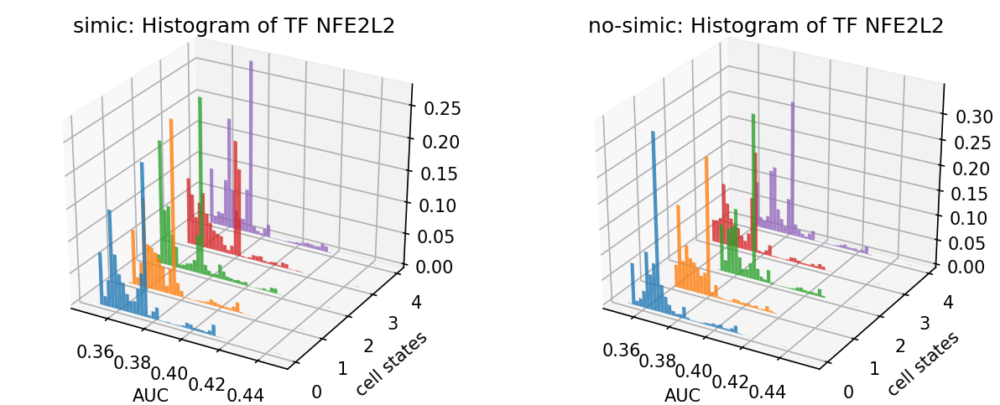

Ubtf


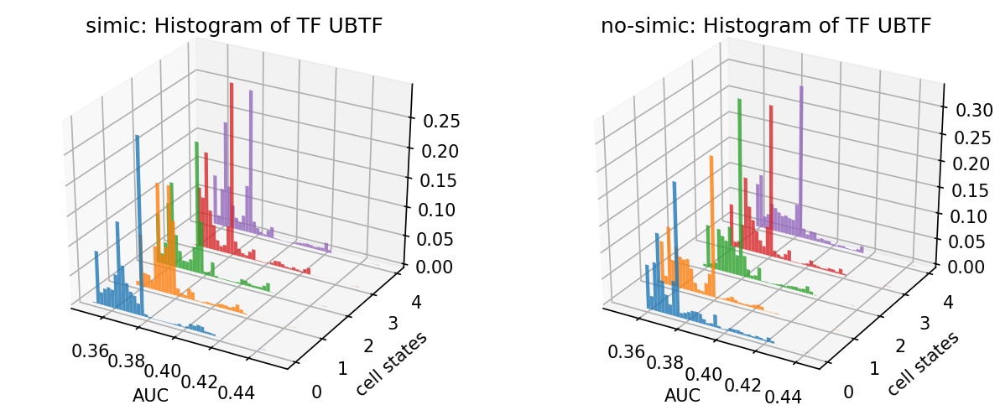

Aebp2


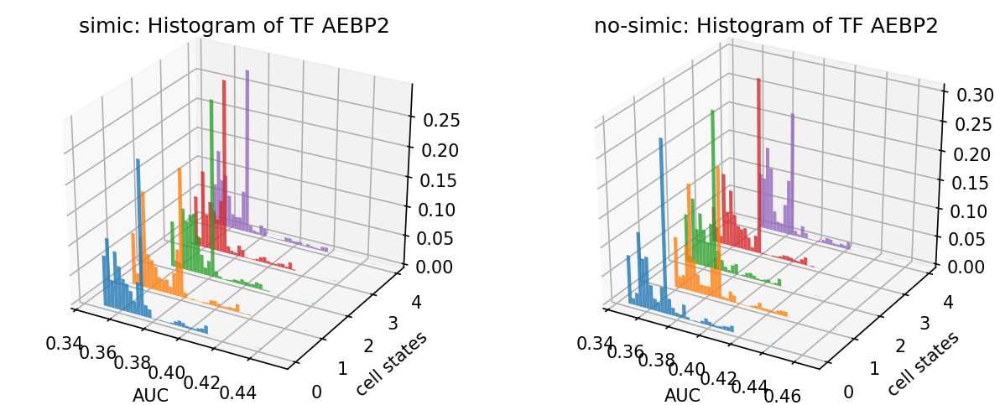

Stat1


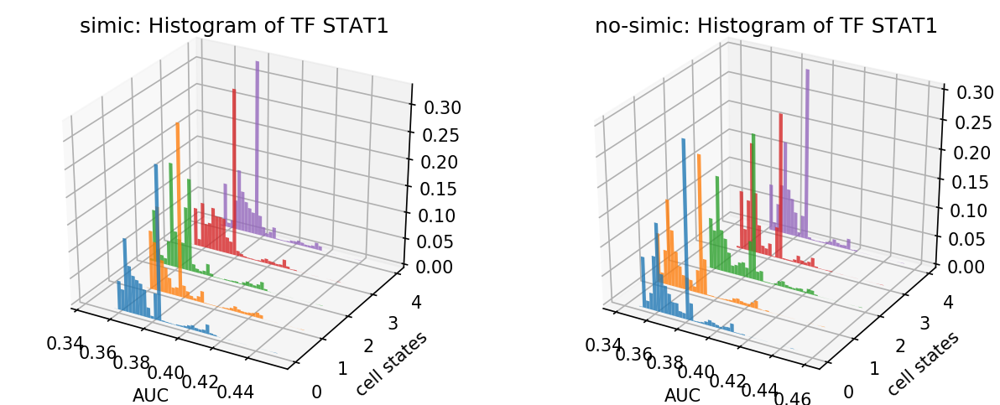

Rara


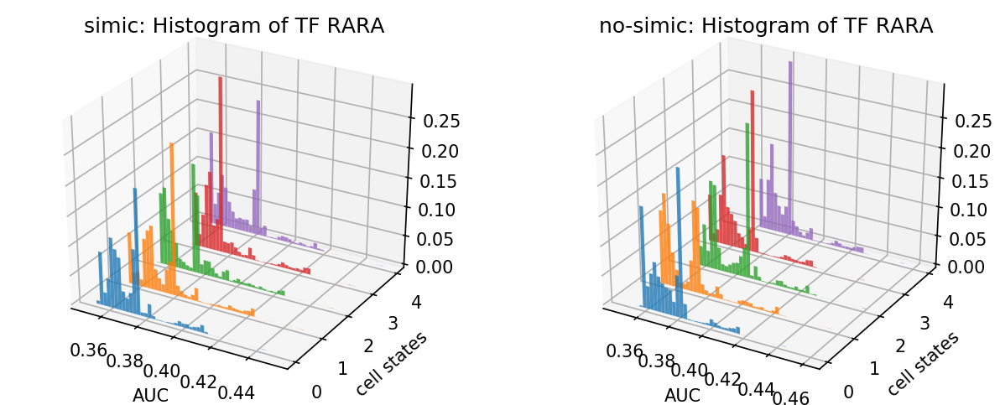

Rest


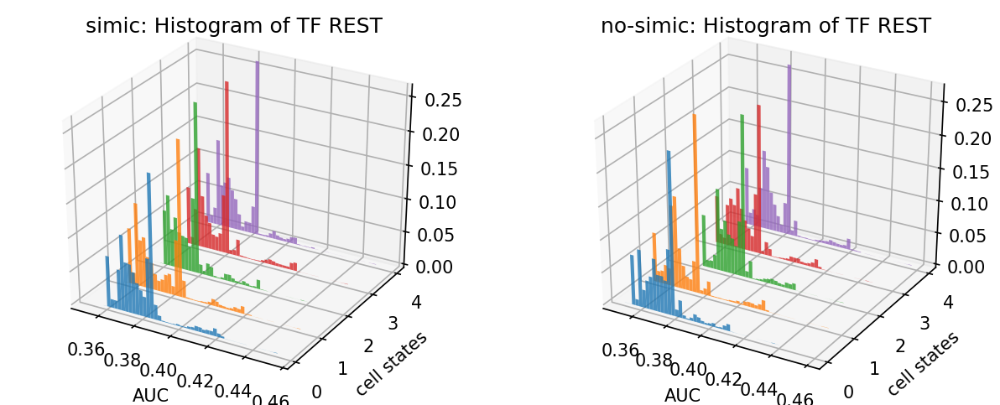

Tfe3


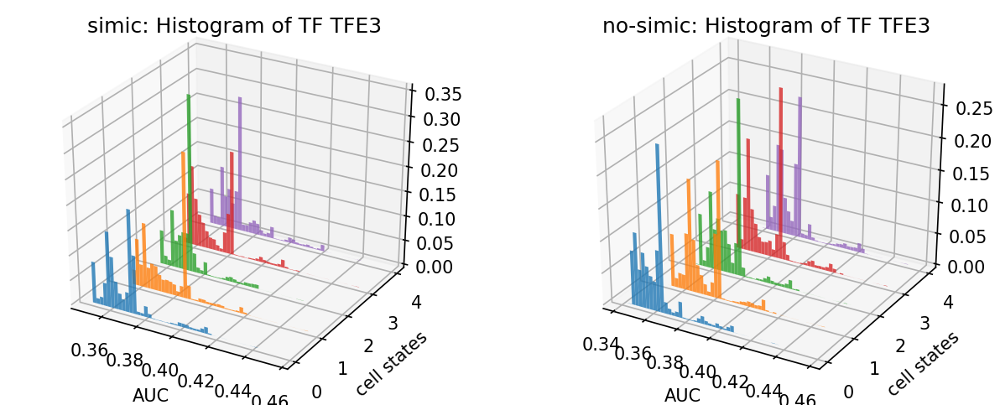

Rreb1


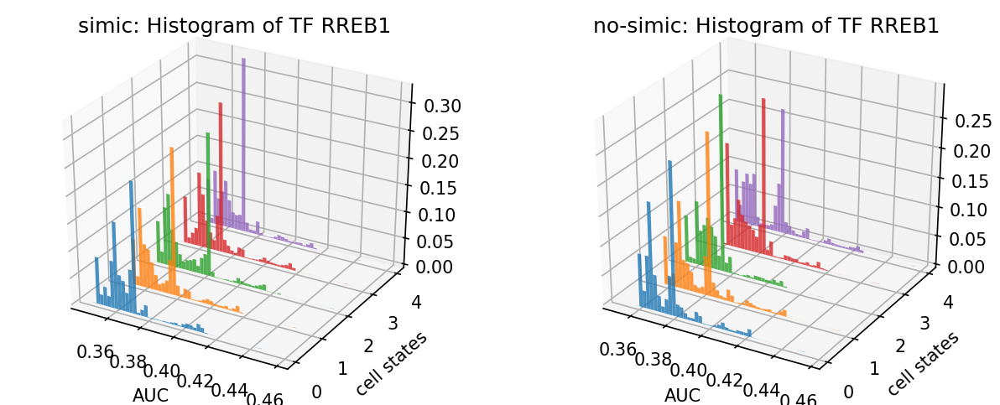

Mxi1


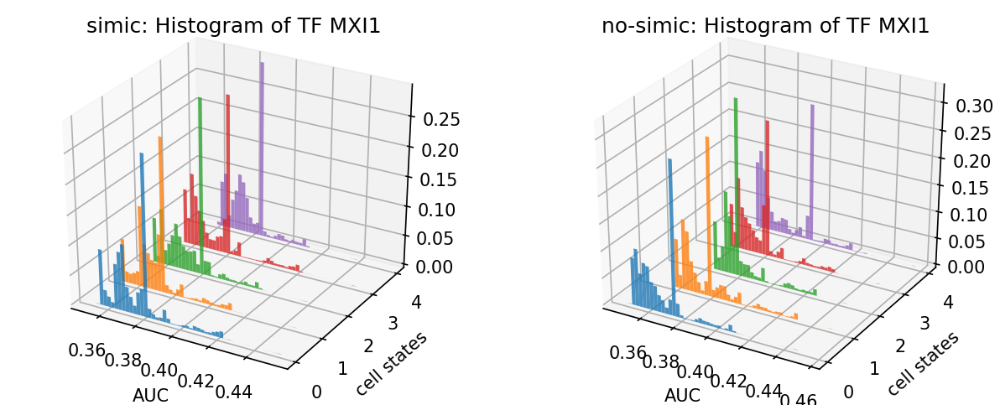

Foxn3


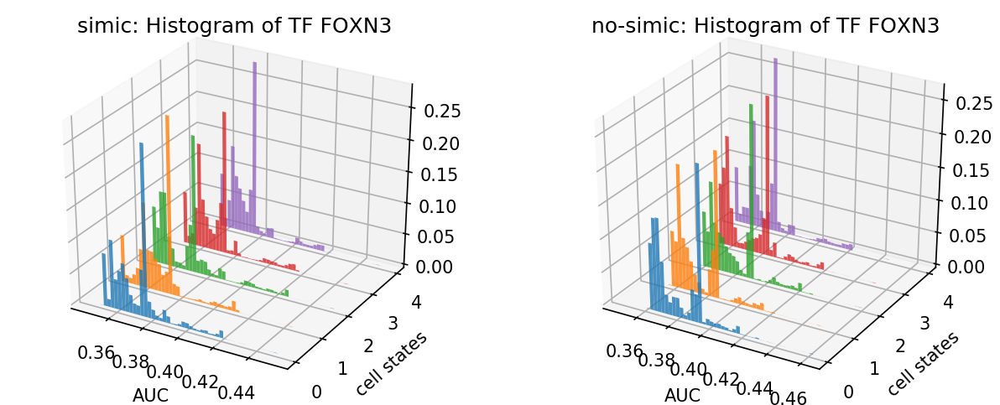

Tbx3


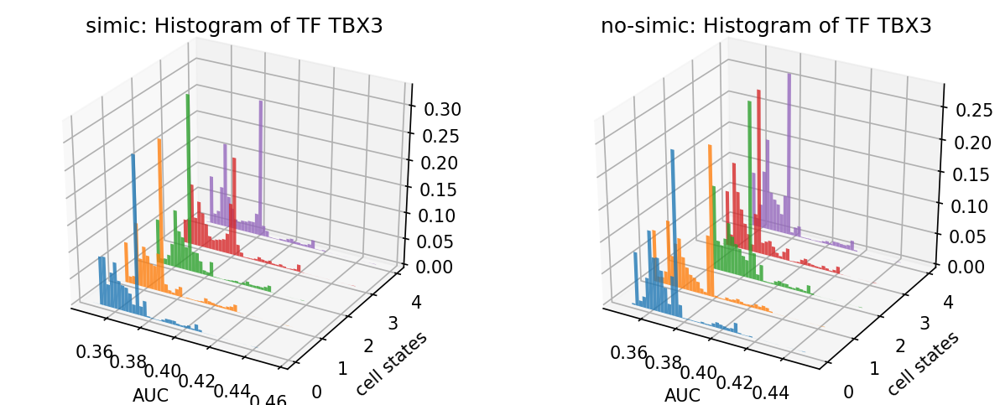

Nr0b2


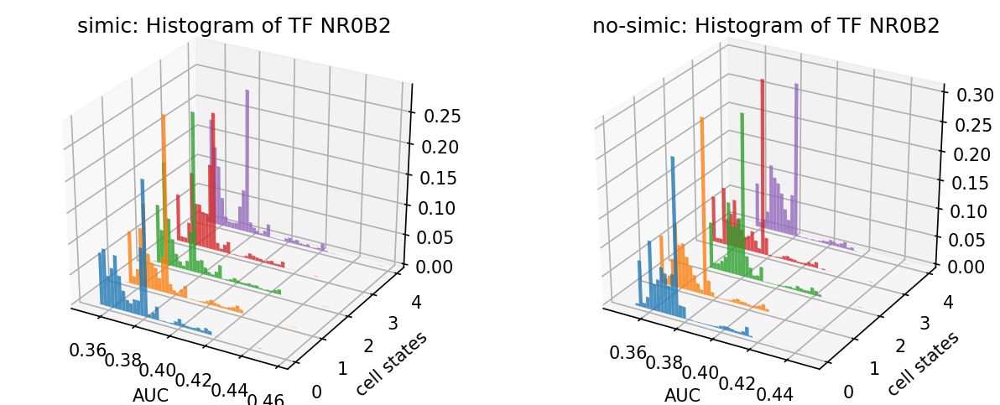

Zfp637


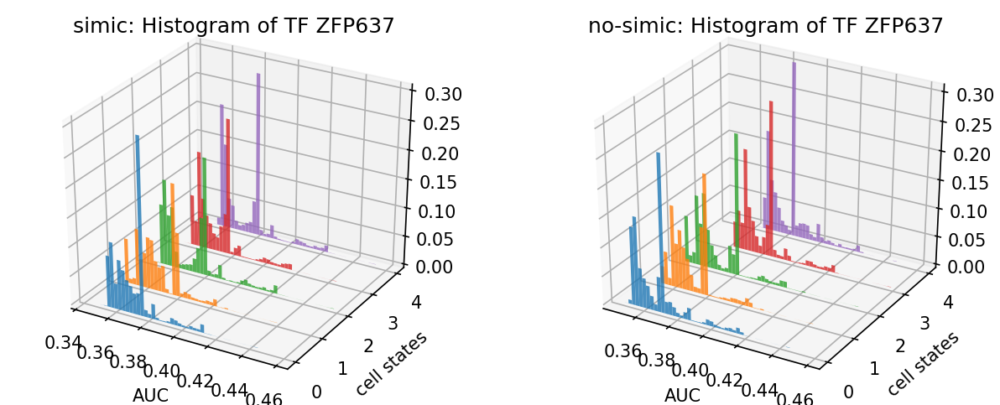

Maf


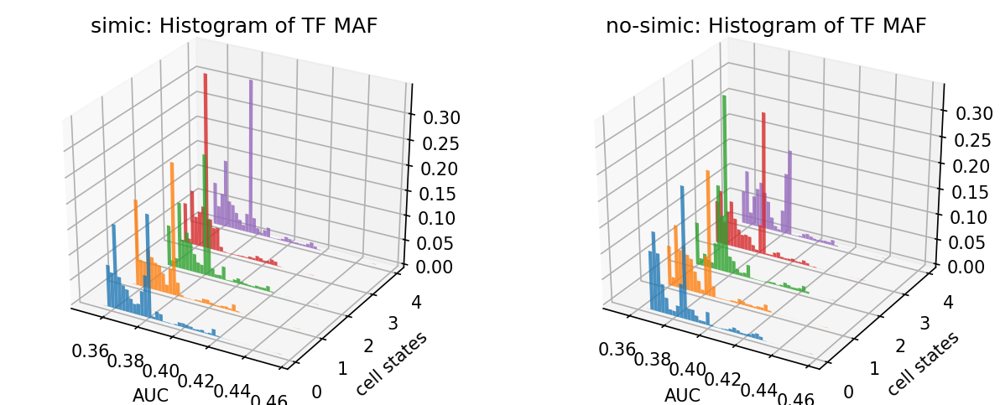

Tox4


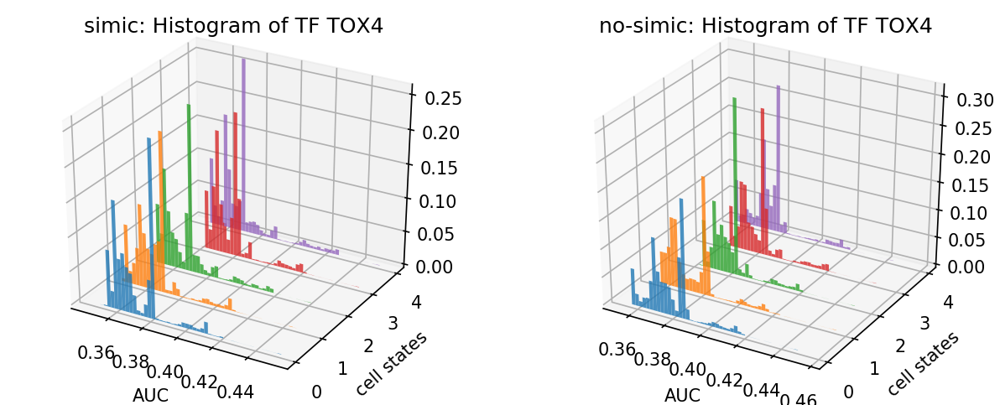

Stat5b


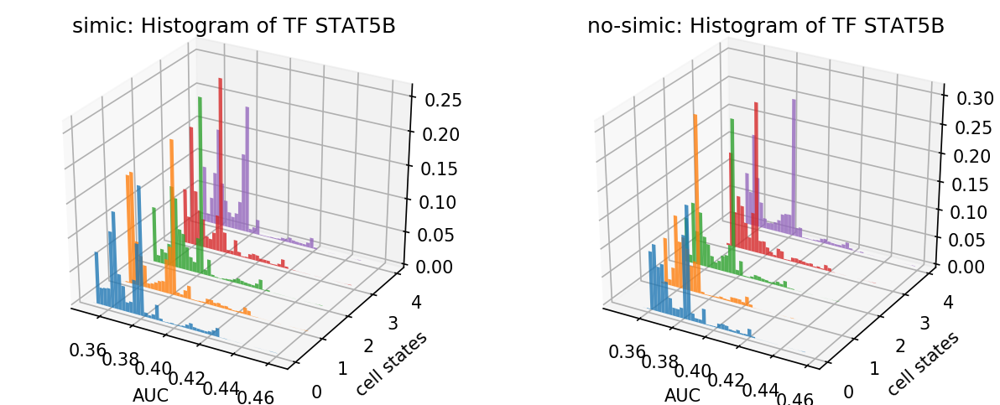

Zkscan1


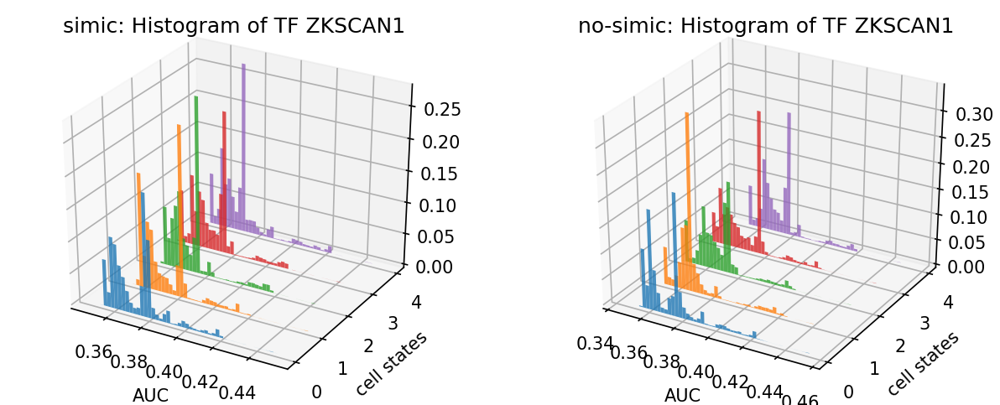

Irf3


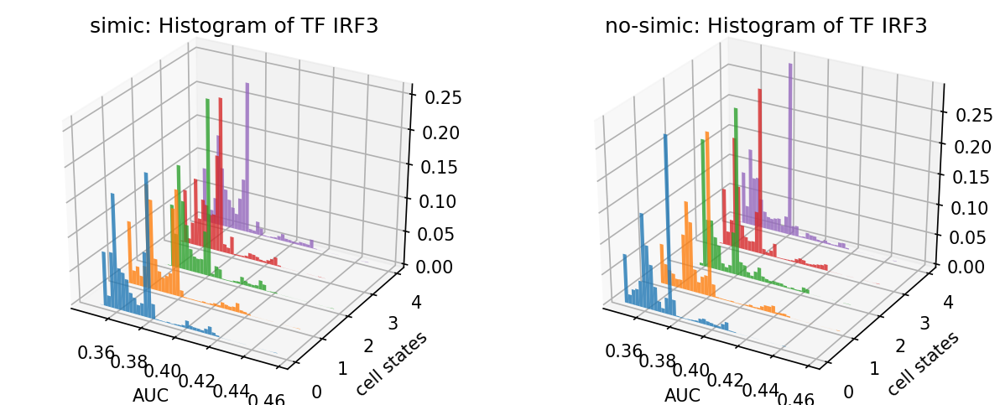

Smad4


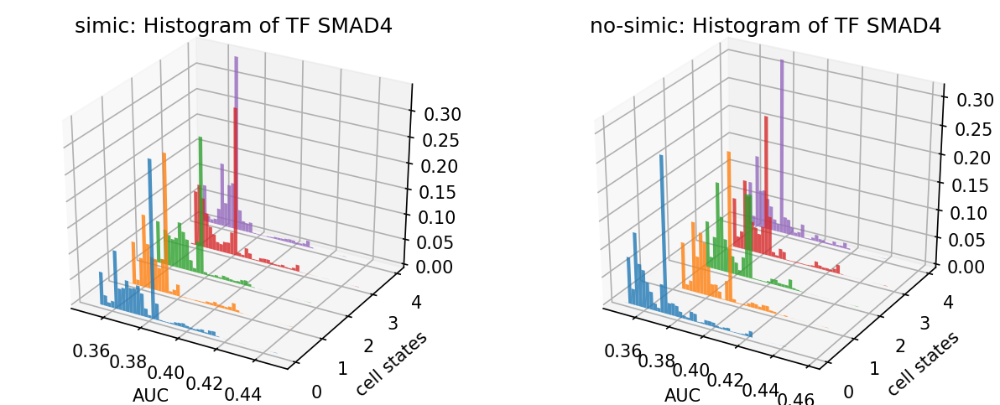

Kdm5a


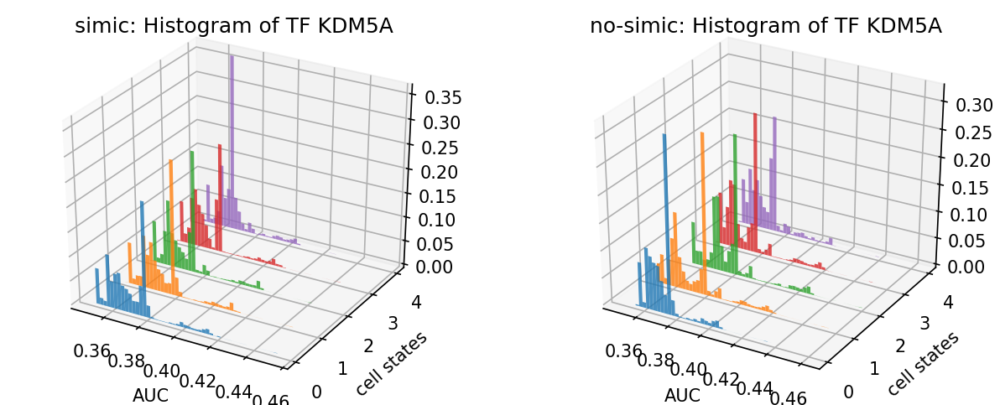

In [12]:
plot_two_in_row(TF_hist_dict_simic, TF_hist_dict_no_simic, last_only_simic)

--------
# TFs that are only rank last variant in no-simic

Atf2


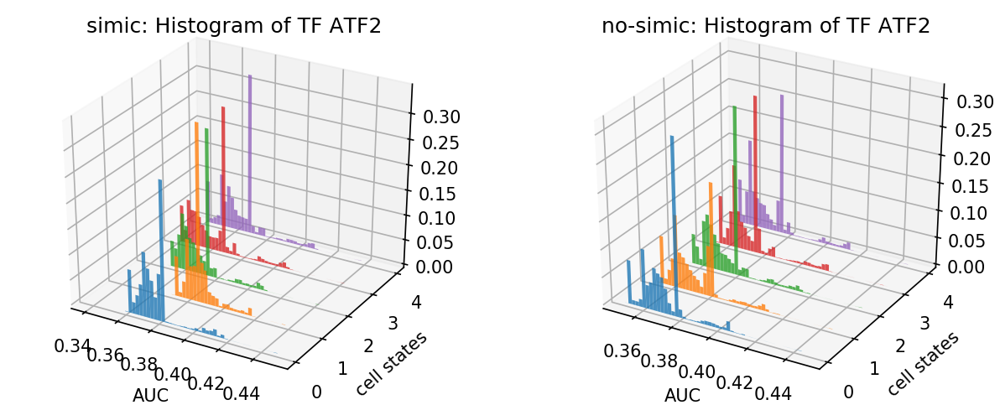

Nr2f2


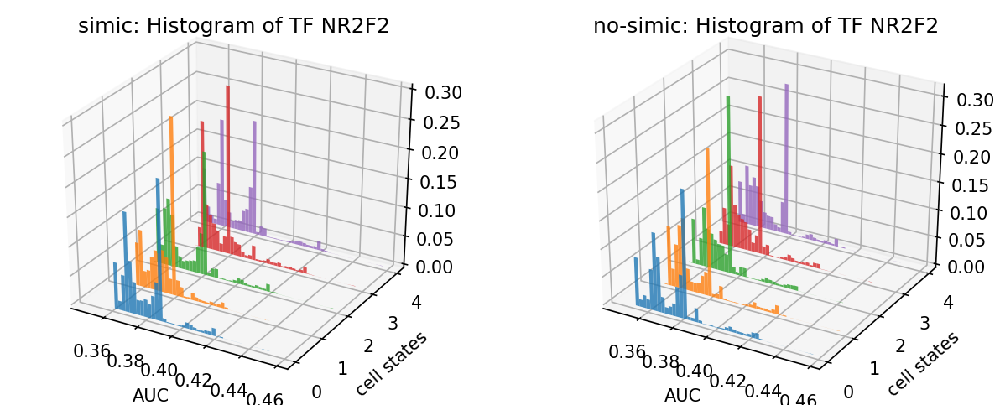

Maz


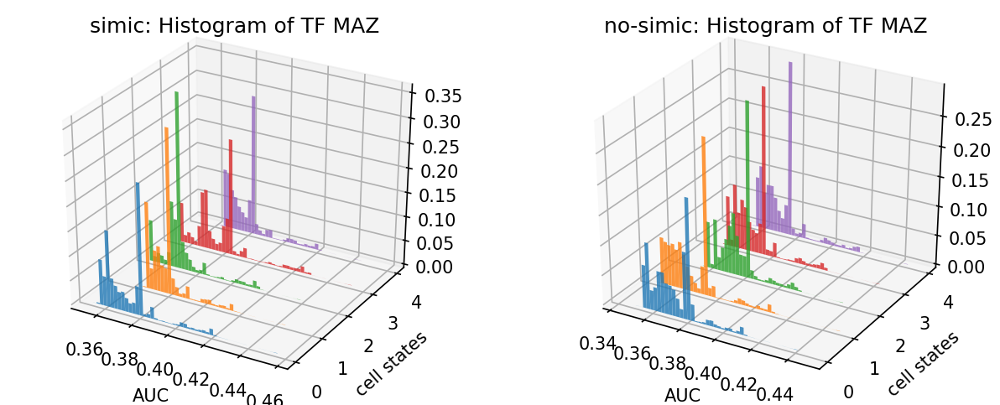

Zbtb33


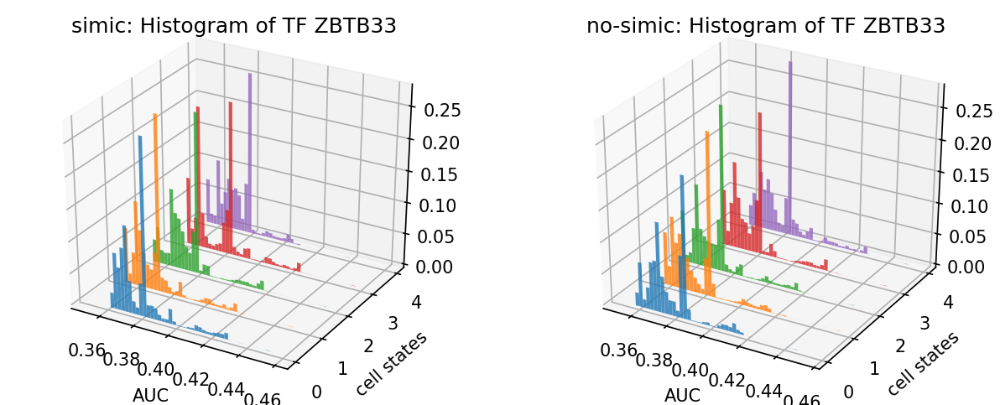

Atf6


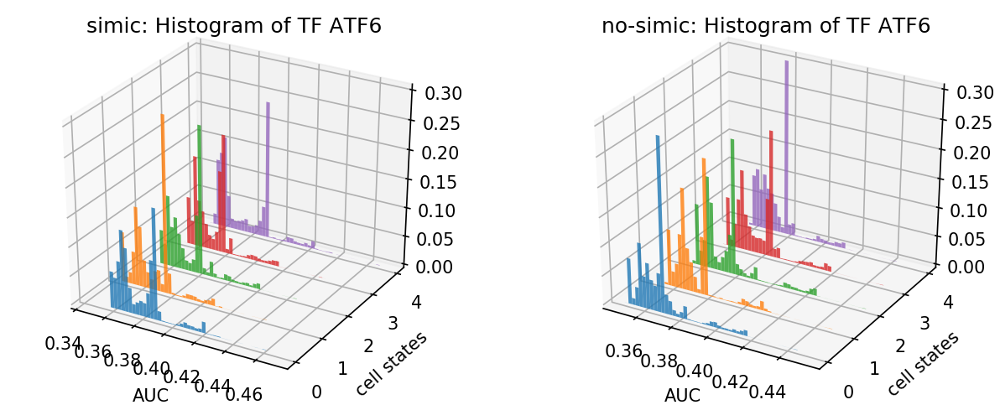

Arid1a


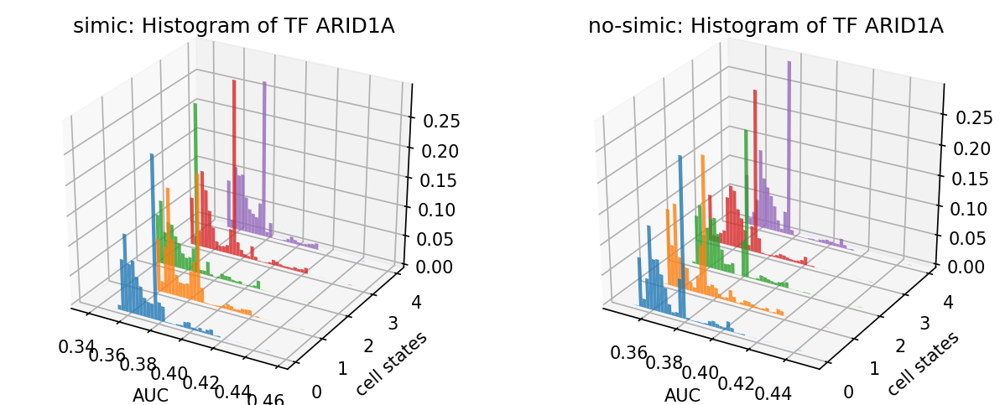

Ubp1


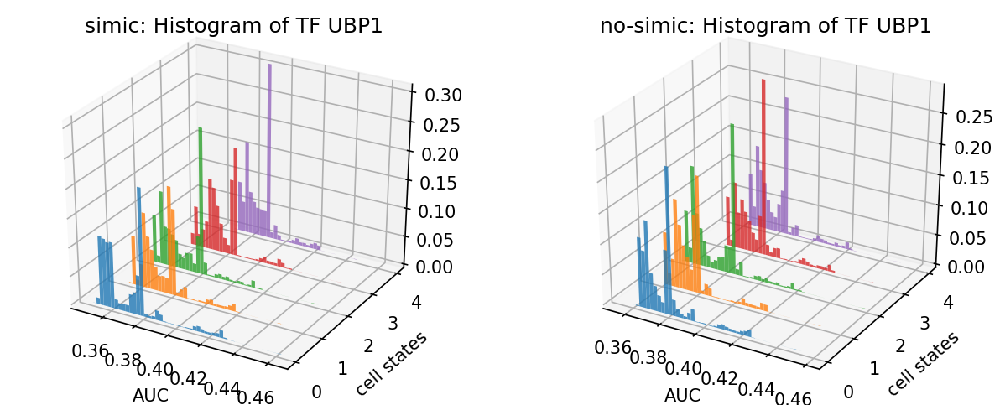

Atf1


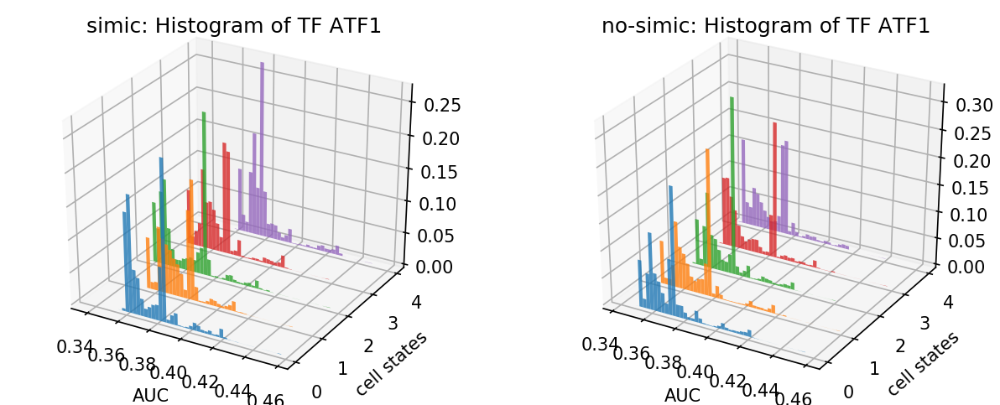

Zfhx3


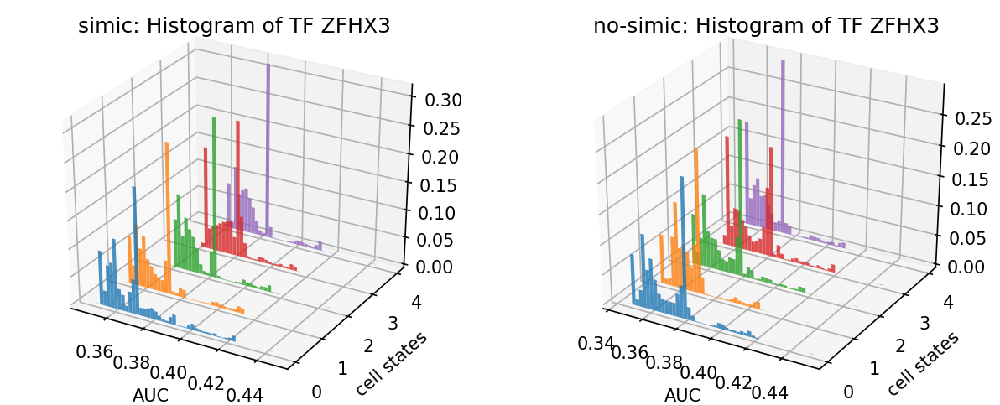

Purb


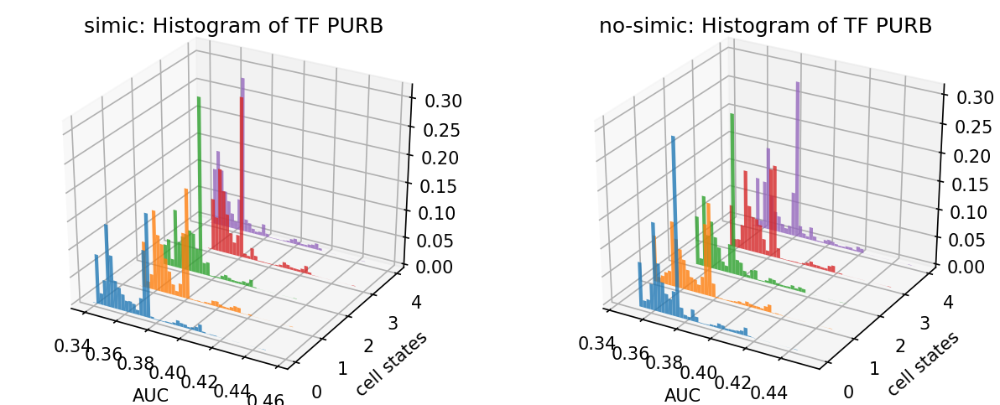

Tshz1


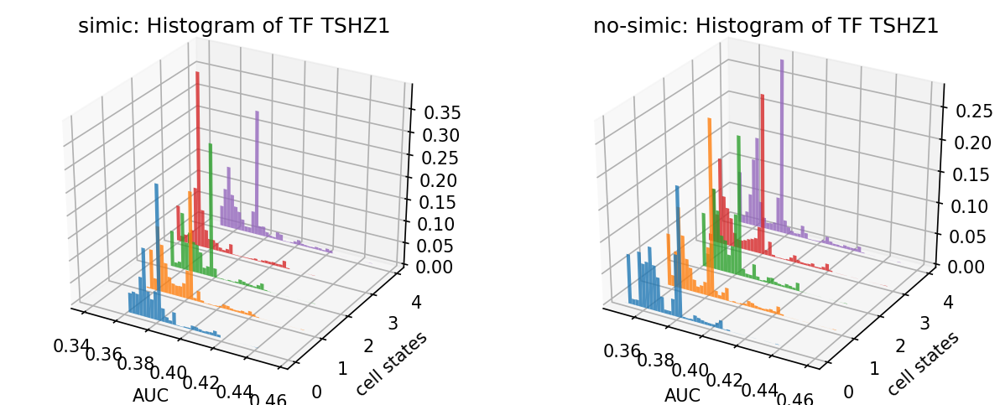

Peg3


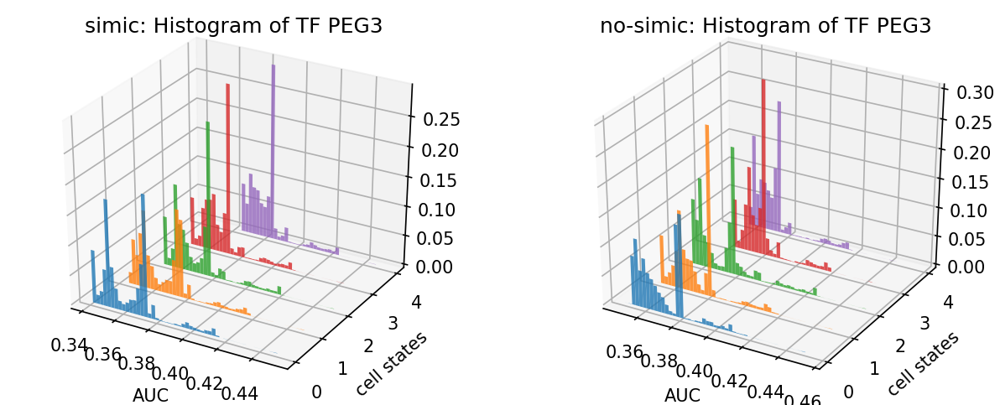

Clock


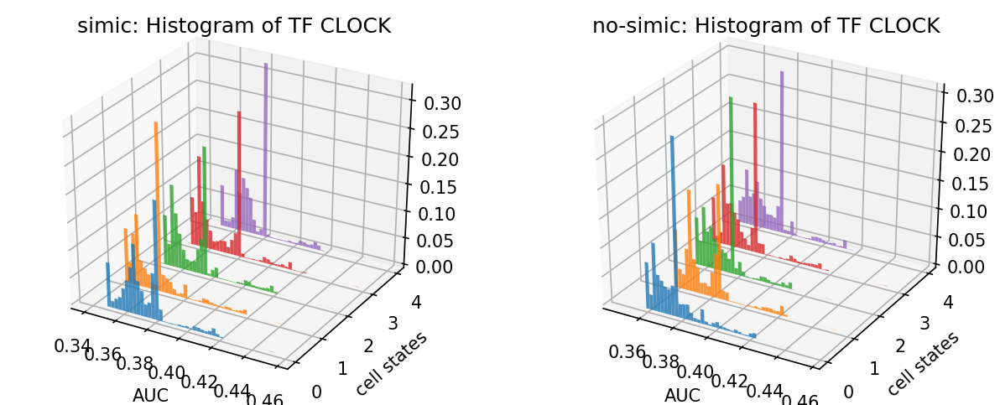

Thrb


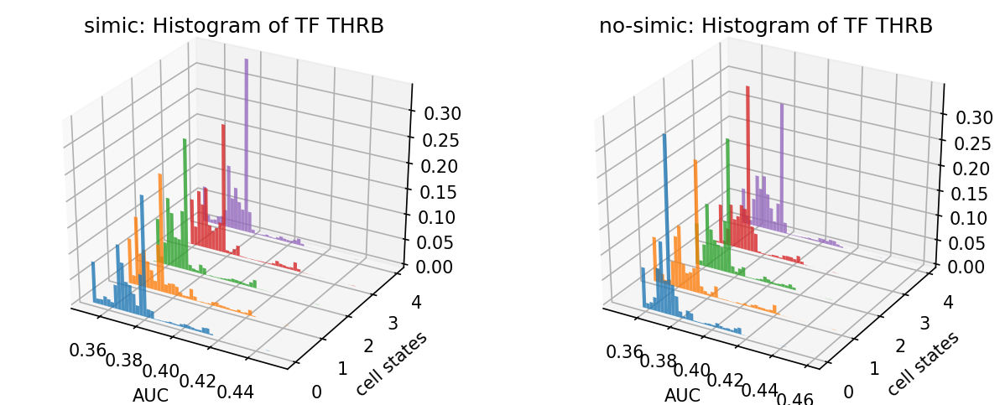

Dnmt1


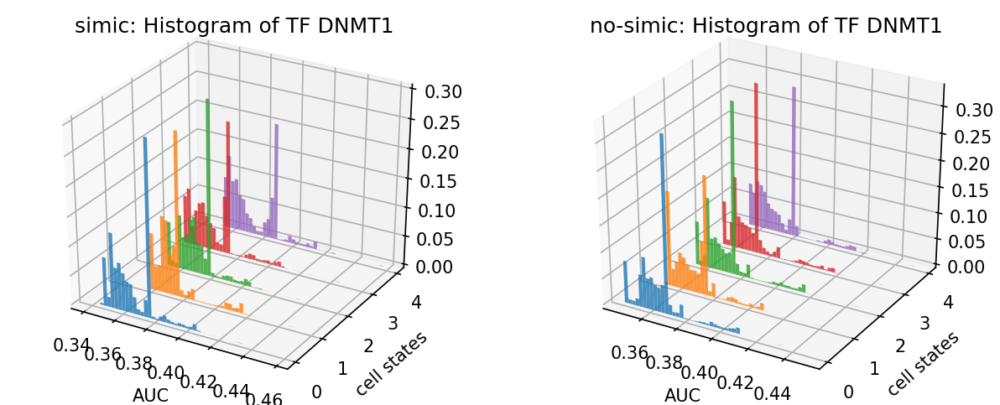

Onecut1


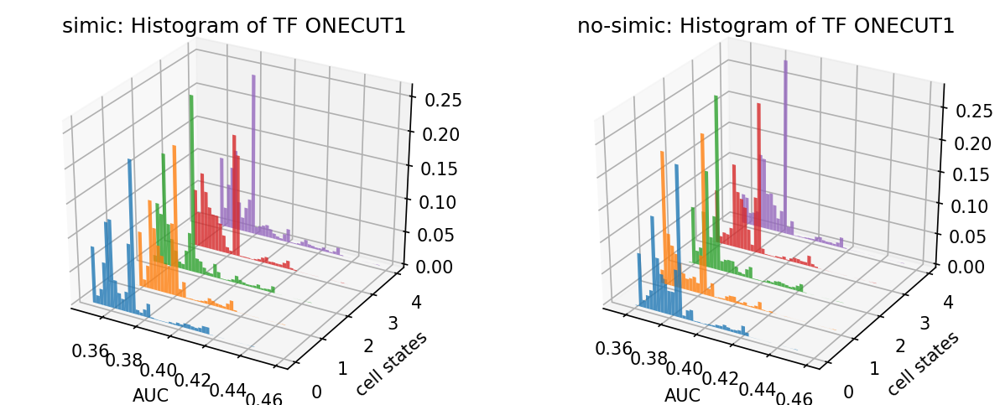

Elk4


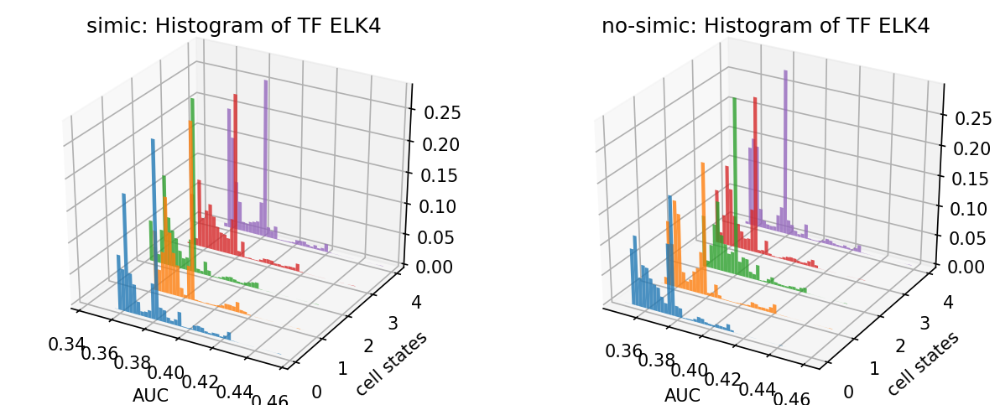

Tef


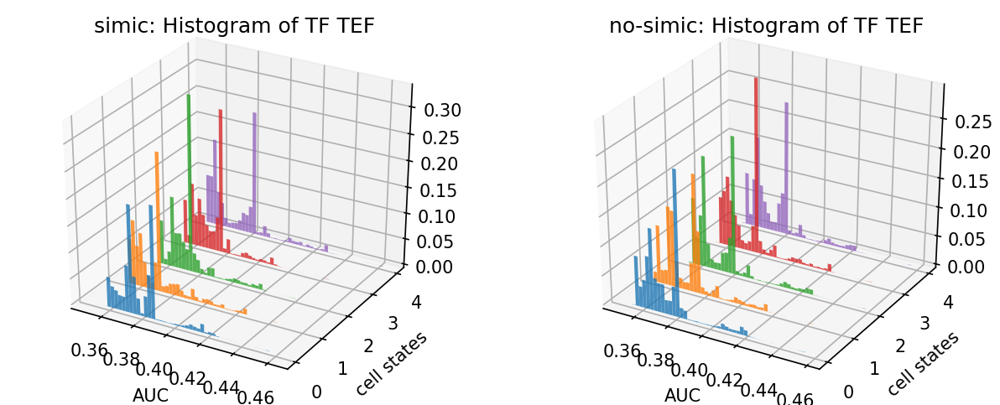

Foxp1


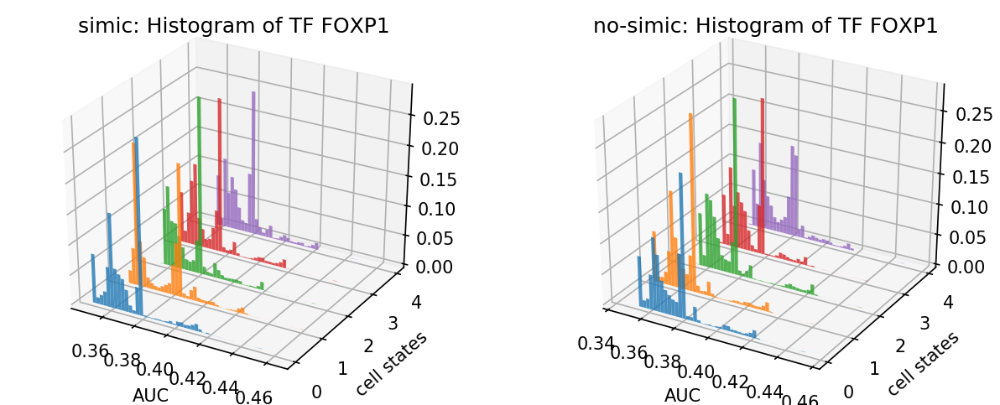

In [13]:
plot_two_in_row(TF_hist_dict_simic, TF_hist_dict_no_simic, last_only_no_simic)

---------
# TFs that are rank top in simic, but last in no-simic

Atf2


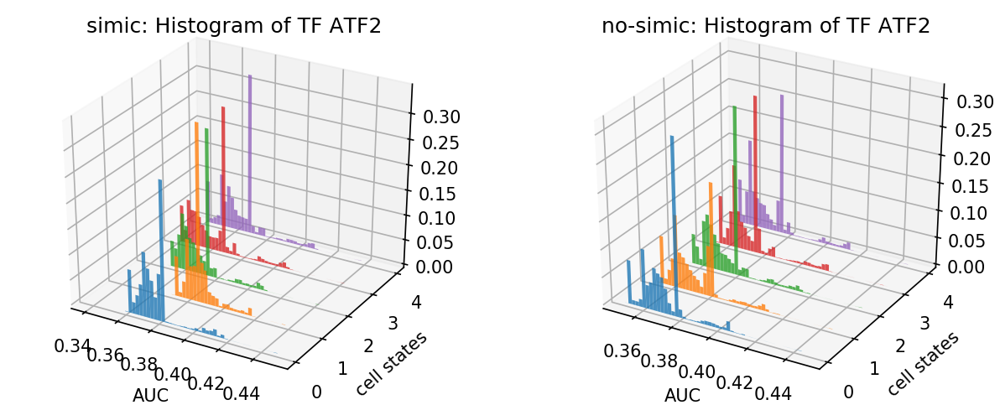

In [14]:
plot_two_in_row(TF_hist_dict_simic, TF_hist_dict_no_simic, top_simic_last_no_simic)

---
# TFs that are rank last in simic, but top in no-simic

In [15]:
plot_two_in_row(TF_hist_dict_simic, TF_hist_dict_no_simic, last_simic_top_no_simic)

-----
# UMAP plot of imputed expression colorred in binarized AUC

In [16]:
import umap
%matplotlib inline

import pickle
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from functools import reduce
import numpy as np
import pandas as pd
import ipdb
import copy
import seaborn as sns

plt.rcParams['figure.dpi'] = 150

In [17]:
p2df = '/data/jianhao/hepatocyte_update_dataset_101619/magic_cell_mat_w_label_pd'
p2assign = '/data/jianhao/hepatocyte_update_dataset_101619/hepa_A249P_assign'

assignment = []
with open(p2assign, 'r') as f:
    for line in f:
        assignment.append(int(line))

df = pd.read_pickle(p2df)
df = df.drop(columns = ['label'])
df

,Rp1,Sox17,Mrpl15,Lypla1,Gm37988,Tcea1,Atp6v1h,Rb1cc1,4732440D04Rik,Pcmtd1,...,Prcd,Gm9465,Gm31508,AC154311.1,Fbxo40,AC168090.1,Wfikkn1,Crisp3,Peli3,Batf2
PN14_AAACCCAAGAAATGGG,0.004854,0.000539,0.591115,0.366935,0.000315,0.239336,0.120199,0.113393,0.002072,0.323168,...,-0.000244,0.000111,-0.000066,0.000232,-1.373859e-05,0.0,0.0,0.0,0.0,0.000152
PN14_AAACCCAAGCTGAGTG,0.004455,0.001884,0.358050,0.271369,0.000951,0.142879,0.088292,0.108493,0.003443,0.247182,...,0.000079,0.000028,0.000041,-0.000073,9.781208e-07,0.0,0.0,0.0,0.0,-0.000062
PN14_AAACCCACAACGTTAC,0.004492,0.001639,0.388067,0.285322,0.000816,0.155048,0.092182,0.108365,0.003189,0.256612,...,0.000009,0.000021,0.000021,-0.000035,-2.123797e-06,0.0,0.0,0.0,0.0,-0.000038
PN14_AAACCCAGTGCAATAA,0.004453,0.001879,0.358323,0.271515,0.000947,0.143037,0.088365,0.108483,0.003443,0.247273,...,0.000078,0.000027,0.000041,-0.000072,9.464348e-07,0.0,0.0,0.0,0.0,-0.000062
PN14_AAACCCAGTGCTCCGA,0.004463,0.001848,0.362035,0.273399,0.000929,0.144476,0.088859,0.108497,0.003409,0.248508,...,0.000068,0.000026,0.000038,-0.000068,4.196861e-07,0.0,0.0,0.0,0.0,-0.000059
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PHx96_TTTGGTTGTACCCGAC,-0.000623,0.000605,1.137205,0.697996,-0.000048,0.472497,0.185700,0.190232,-0.000664,0.583412,...,0.003913,0.001488,0.000498,0.002821,1.312452e-03,0.0,0.0,0.0,0.0,0.001682
PHx96_TTTGGTTTCCAGTGTA,0.000141,-0.000569,0.940362,0.768103,-0.000276,0.415704,0.176906,0.225551,0.003126,0.655176,...,0.003943,0.000501,0.000726,0.002950,1.810040e-03,0.0,0.0,0.0,0.0,0.001591
PHx96_TTTGGTTTCCATGATG,-0.000056,-0.000831,0.883037,0.738153,-0.000483,0.388767,0.159912,0.214883,0.002815,0.619076,...,0.003794,0.000426,0.000728,0.002927,1.830409e-03,0.0,0.0,0.0,0.0,0.001548
PHx96_TTTGTTGCAAGCTACT,0.003265,0.002349,0.657112,1.464797,-0.000965,0.585532,0.355755,0.569388,0.017105,1.287136,...,0.001492,-0.000112,0.000185,0.001373,2.877550e-03,0.0,0.0,0.0,0.0,0.000824


In [18]:
set(assignment)

{0, 1, 2, 3, 4}

In [19]:
reducer = umap.UMAP()
embedding = reducer.fit_transform(df.values)
print(embedding.shape)

/home/jianhao2/miniconda3/envs/conda3_py/lib/python3.6/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 4 separate connected components using meta-embedding (experimental)
  n_components


(18272, 2)


In [20]:
len(assignment)

18272

In [56]:
def umap_plot(embedding, assignment, title, n_states = None):
    if n_states == None:
        n_states = len(set(assignment))
    plt.figure(figsize = (4, 3))
    scatter = plt.scatter(embedding[:, 0], embedding[:, 1], c=assignment, cmap = 'Spectral', s = 5)
    plt.colorbar(boundaries=np.arange(n_states + 1) - 0.5).set_ticks(np.arange(n_states))
    plt.title(title)
    
    plt.grid(alpha = 0.5)
    plt.show()

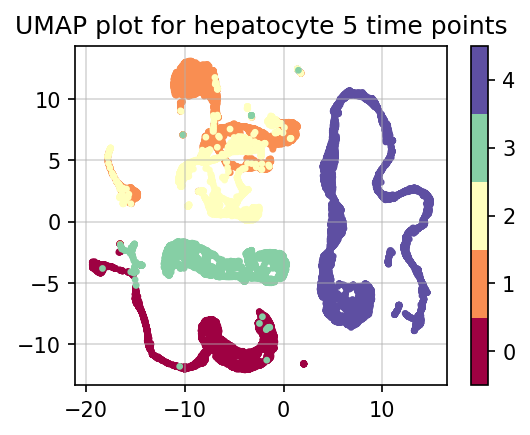

In [57]:
# n_states = len(set(assignment))
umap_plot(embedding, assignment, 'UMAP plot for hepatocyte 5 time points')

# Compare the shift in binarized label

In [72]:
# selected_gene = 'atf2'
selected_gene = 'nr1h3'
# threshold = 0.37

## Results for simic

In [69]:
with open(p2AUC_dict_simic, 'rb') as f:
    AUC_dict_simic = pickle.load(f)
AUC_dict_simic.keys()

dict_keys([0, 1, 2, 3, 4])

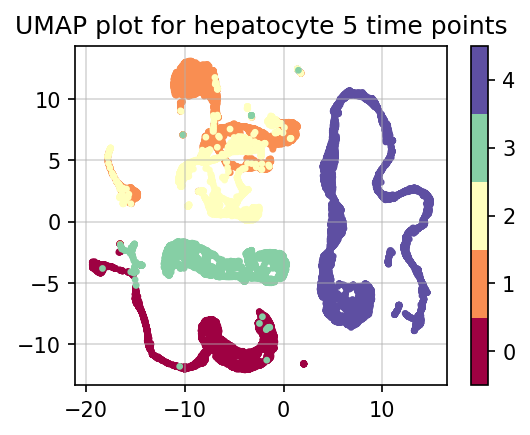

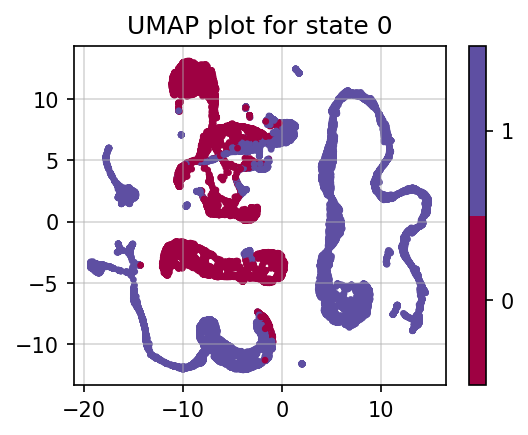

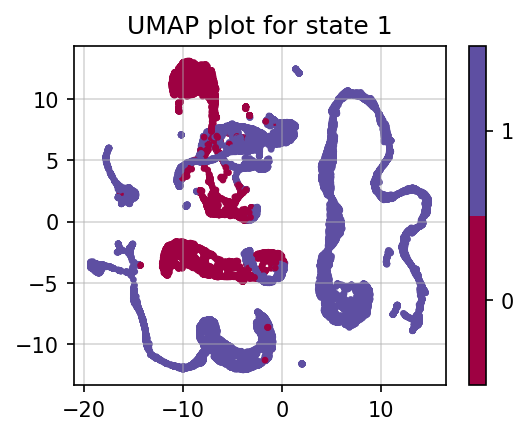

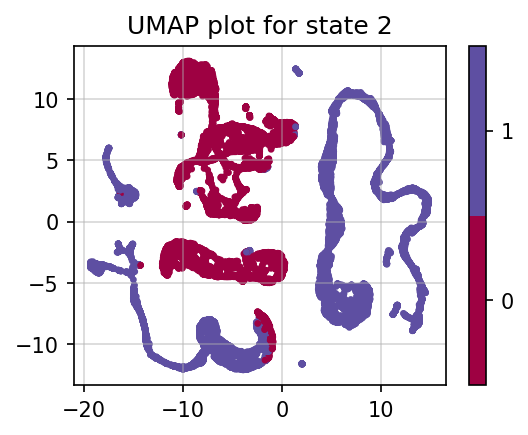

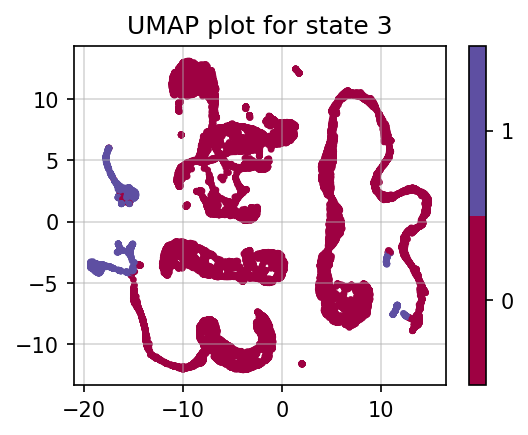

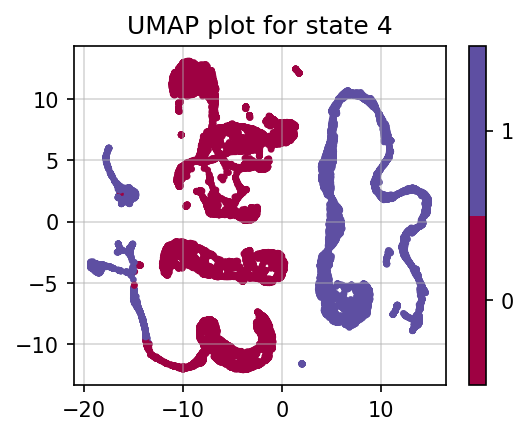

In [76]:
umap_plot(embedding, assignment, 'UMAP plot for hepatocyte 5 time points')
threshold = 0.37
for state in AUC_dict_simic.keys():
#     AUC_dict_simic[0].keys()
    binarized_label = (AUC_dict_simic[state][selected_gene.capitalize()] > threshold).astype(int).values
    n_states = 2
    umap_plot(embedding, binarized_label, 'UMAP plot for state {}'.format(state), n_states)

## Results for no simic

In [61]:
with open(p2AUC_dict_no_simic, 'rb') as f:
    AUC_dict_no_simic = pickle.load(f)
AUC_dict_no_simic.keys()

dict_keys([0, 1, 2, 3, 4])

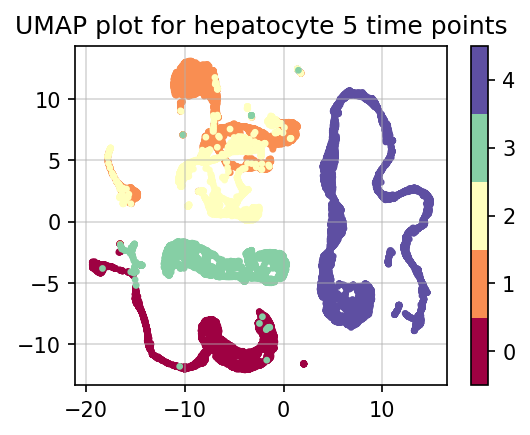

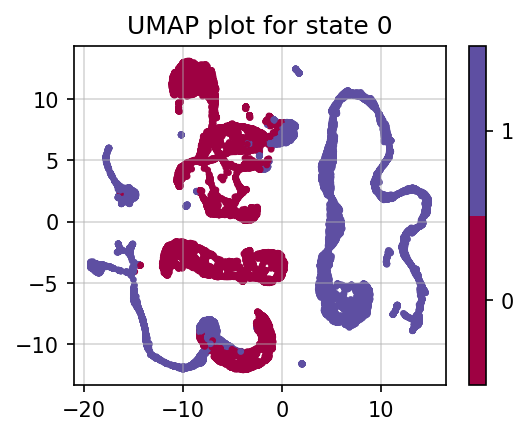

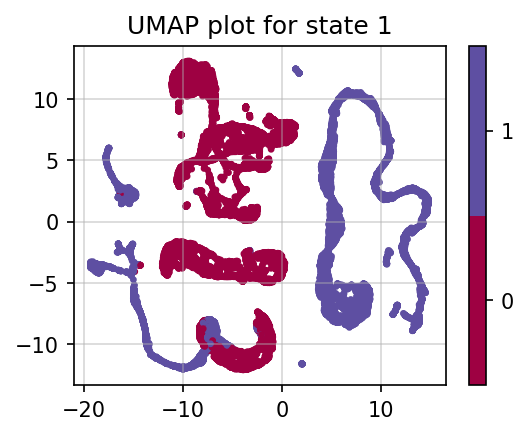

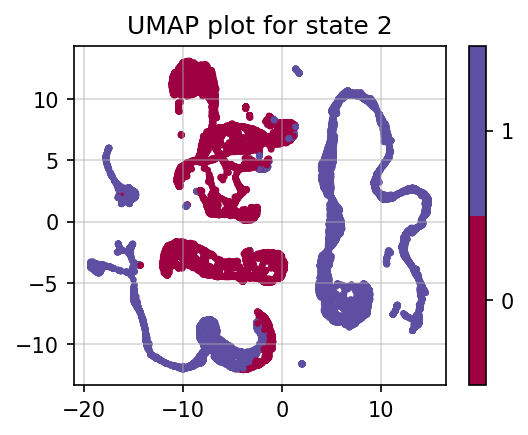

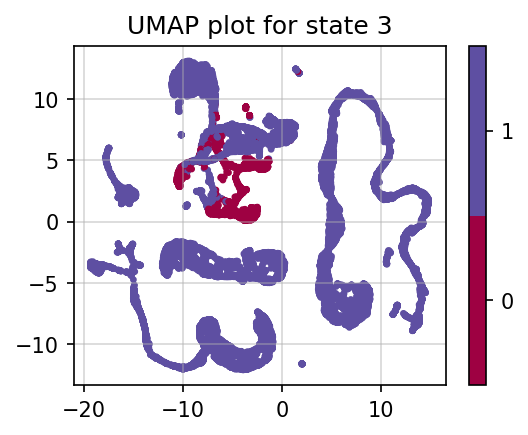

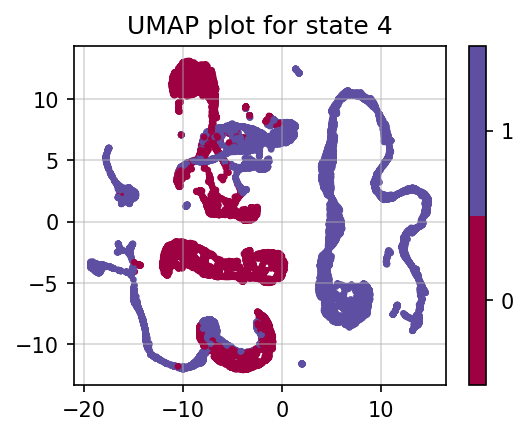

In [78]:
umap_plot(embedding, assignment, 'UMAP plot for hepatocyte 5 time points')
threshold = 0.37
for state in AUC_dict_no_simic.keys():
#     AUC_dict_simic[0].keys()
    binarized_label = (AUC_dict_no_simic[state][selected_gene.capitalize()] > threshold).astype(int).values
    n_states = 2
    umap_plot(embedding, binarized_label, 'UMAP plot for state {}'.format(state), n_states)